In [1]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [2]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)

2.13.0


In [3]:
import math
from PIL import Image
from keras import backend as K
import matplotlib.pyplot as plt
plt.rc('font', size=16)
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

<h3>Load dataset and augment</h3>

In [4]:
normalized_volumes = np.load("/kaggle/input/biocv-dataset-true/normalized_dataset.npy")
X = [np.expand_dims(image,axis=-1) for volume in normalized_volumes for image in volume]
X = np.array(X)

In [5]:
vols_labels = np.load("/kaggle/input/biocv-dataset-true/labels.npy")
y = [np.expand_dims(image,axis=-1) for volume in vols_labels for image in volume]
y = np.array(y)

X = X.astype(np.float32)
print(len(np.unique(y)))

5


In [6]:
from sklearn.utils import shuffle
X,y = shuffle(X,y, random_state = seed)

In [7]:
#Map original mask values to categorical encoding
segmentation_values_list = [0]+list(range(55,70)) +\
                            list(range(110, 135)) +\
                            list(range(175, 200)) +\
                            list(range(240, 255)) 
value_ranges = {
    (0,5) : 0,  #unlabelled
    (55, 70): 1, #Liver
    (110, 135): 2, #Right Kidney
    (175, 200): 3, #Left Kidney
    (240, 255): 4, #Spleen
}
def map_value_to_range(value, range_mapping):
    for value_range, label in range_mapping.items():
        if value_range[0] <= value <= value_range[1]:
            return label
    return -1
category_map = {value : map_value_to_range(value, value_ranges) for value in segmentation_values_list }
#print(category_map)
y = np.vectorize(category_map.get)(y)
#print(y)
num_classes = len(np.unique(y))
print('Number of classes',num_classes)

Number of classes 5


In [8]:

import albumentations as A

# Split the data into training, validation, and test sets
X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=80, random_state=seed)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=80, random_state=seed)


augment = True
#Augment training data
if augment:
    transform = A.Compose([
        A.RandomCrop(width=256, height=256),
        A.Blur(p=0.8),
        #A.GaussNoise(p=0.65, var_limit=2.) 
        #A.RandomBrightnessContrast(p=1,brightness_limit=0.0001,contrast_limit=0.0001),
    ])
    X_train_a = []
    y_train_a = []
    for i in range(len(X_train)):
        augmented= transform(image=np.array(X_train[i],ndmin = 3),mask=np.array(y_train[i],ndmin=3)) 
        X_train_a.append(augmented["image"])
        y_train_a.append(augmented["mask"])
    X_train_a = np.array(X_train_a)
    y_train_a = np.array(y_train_a)
    X_train = np.concatenate((X_train,X_train_a))
    y_train = np.concatenate((y_train,y_train_a))

    transform = A.Compose([
        A.GaussNoise(var_limit=0.3, p = 1.), 
        #A.RandomBrightnessContrast(p=1,brightness_limit=0.0001,contrast_limit=0.0001)
    ])
    
    X_train_a1 = []
    y_train_a1 = []
    for i in range(len(X_train)):
        augmented= transform(image=np.array(X_train[i],ndmin = 3),mask=np.array(y_train[i],ndmin=3)) 
        X_train_a1.append(augmented["image"])
        y_train_a1.append(y_train[i])
    X_train_a1 = np.array(X_train_a1)
    y_train_a1 = np.array(y_train_a1)
    X_train = np.concatenate((X_train,X_train_a1))
    y_train = np.concatenate((y_train,y_train_a1))

# Display the shapes of the resulting datasets
X_train.shape, y_train.shape, X_val.shape, y_val.shape, X_test.shape, y_test.shape

((2000, 256, 256, 1),
 (2000, 256, 256, 1),
 (80, 256, 256, 1),
 (80, 256, 256, 1),
 (80, 256, 256, 1),
 (80, 256, 256, 1))

In [9]:
def display_color_mapped_image_continuous(image, n_colors=29):
    """
    Display an image with colors mapped from a given image array using a continuous colormap.
    The image array should contain integer values from 0 to n_colors-1, where each integer
    represents a different color sampled linearly from the colormap.

    Args:
    image (ndarray): An array of shape (H, W) containing integer values from 0 to n_colors-1.
    n_colors (int): The number of colors to use from the colormap. Max 30.
    """
    if n_colors > 30:
        raise ValueError("Maximum number of colors is 30.")
    if not (0 <= image.min() and image.max() < n_colors):
        raise ValueError("Image values should be in the range [0, n_colors-1].")

    # Using a continuous colormap (like 'viridis') and sampling linearly
    cmap = plt.get_cmap('')
    colors = cmap(np.linspace(0, 1, n_colors))

    # Map the colors
    colored_image = colors[image]

    return colored_image

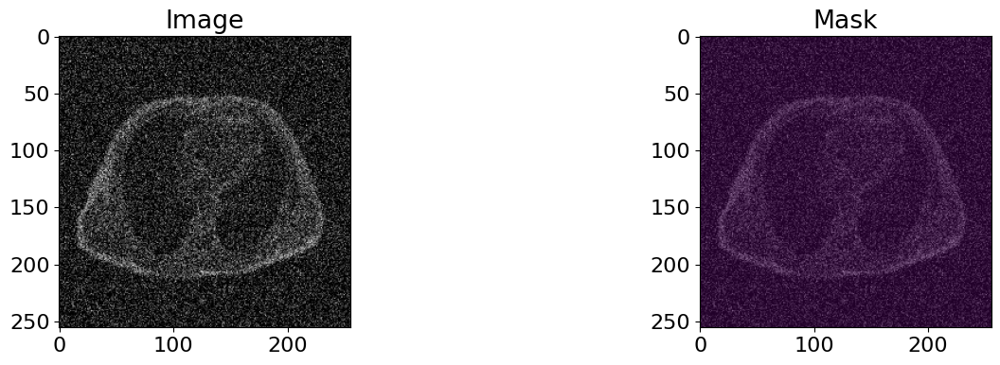

In [10]:
def plot_pairs(data, labels, index=None):
    if index == None:
        index = np.random.randint(0,len(data))
    fig, axes = plt.subplots(1, 2, figsize=(16,4))
    axes[0].set_title("Image")
    axes[0].imshow(data[index], cmap='gray')
    axes[1].set_title("Mask")
    axes[1].imshow(data[index], cmap='gray')
    #colored_image = display_color_mapped_image_continuous(labels[index])
    axes[1].imshow(np.squeeze(labels[index]),alpha=0.5)
    plt.show()
plot_pairs(X_train,y_train)

In [11]:
input_shape = X_train.shape[1:]
print('Input shape',input_shape)

Input shape (256, 256, 1)


<h3>Build UNet</h3>

In [12]:
from keras.layers import concatenate, add
def conv2d_bn(x, filters, num_row, num_col, padding='same', strides=(1, 1), activation='relu', name=None):
    '''
    2D Convolutional layers
    
    Arguments:
        x {keras layer} -- input layer 
        filters {int} -- number of filters
        num_row {int} -- number of rows in filters
        num_col {int} -- number of columns in filters
    
    Keyword Arguments:
        padding {str} -- mode of padding (default: {'same'})
        strides {tuple} -- stride of convolution operation (default: {(1, 1)})
        activation {str} -- activation function (default: {'relu'})
        name {str} -- name of the layer (default: {None})
    
    Returns:
        [keras layer] -- [output layer]
    '''

    x = tfkl.Conv2D(filters, (num_row, num_col), strides=strides, padding=padding, use_bias=False)(x)
    x = tfkl.BatchNormalization(axis=3, scale=False)(x)

    if(activation == None):
        return x

    x = tfkl.Activation(activation, name=name)(x)

    return x


def trans_conv2d_bn(x, filters, num_row, num_col, padding='same', strides=(2, 2), name=None):
    '''
    2D Transposed Convolutional layers
    
    Arguments:
        x {keras layer} -- input layer 
        filters {int} -- number of filters
        num_row {int} -- number of rows in filters
        num_col {int} -- number of columns in filters
    
    Keyword Arguments:
        padding {str} -- mode of padding (default: {'same'})
        strides {tuple} -- stride of convolution operation (default: {(2, 2)})
        name {str} -- name of the layer (default: {None})
    
    Returns:
        [keras layer] -- [output layer]
    '''

    x = tfkl.Conv2DTranspose(filters, (num_row, num_col), strides=strides, padding=padding)(x)
    x = tfkl.BatchNormalization(axis=3, scale=False)(x)
    
    return x


def MultiResBlock(U, inp, alpha = 1.67):
    '''
    MultiRes Block
    
    Arguments:
        U {int} -- Number of filters in a corrsponding UNet stage
        inp {keras layer} -- input layer 
    
    Returns:
        [keras layer] -- [output layer]
    '''

    W = alpha * U

    shortcut = inp

    shortcut = conv2d_bn(shortcut, int(W*0.167) + int(W*0.333) +
                         int(W*0.5), 1, 1, activation=None, padding='same')

    conv3x3 = conv2d_bn(inp, int(W*0.167), 3, 3,
                        activation='relu', padding='same')

    conv5x5 = conv2d_bn(conv3x3, int(W*0.333), 3, 3,
                        activation='relu', padding='same')

    conv7x7 = conv2d_bn(conv5x5, int(W*0.5), 3, 3,
                        activation='relu', padding='same')

    out = concatenate([conv3x3, conv5x5, conv7x7], axis=3)
    out = tfkl.BatchNormalization(axis=3)(out)

    out = add([shortcut, out])
    out = tfkl.Activation('relu')(out)
    out = tfkl.BatchNormalization(axis=3)(out)

    return out


def ResPath(filters, length, inp):
    '''
    ResPath
    
    Arguments:
        filters {int} -- [description]
        length {int} -- length of ResPath
        inp {keras layer} -- input layer 
    
    Returns:
        [keras layer] -- [output layer]
    '''


    shortcut = inp
    shortcut = conv2d_bn(shortcut, filters, 1, 1,
                         activation=None, padding='same')

    out = conv2d_bn(inp, filters, 3, 3, activation='relu', padding='same')

    out = add([shortcut, out])
    out = tfkl.Activation('relu')(out)
    out = tfkl.BatchNormalization(axis=3)(out)

    for i in range(length-1):

        shortcut = out
        shortcut = conv2d_bn(shortcut, filters, 1, 1,
                             activation=None, padding='same')

        out = conv2d_bn(out, filters, 3, 3, activation='relu', padding='same')

        out = add([shortcut, out])
        out = tfkl.Activation('relu')(out)
        out = tfkl.BatchNormalization(axis=3)(out)

    return out


def MultiResUnet(height, width, n_channels):
    '''
    MultiResUNet
    
    Arguments:
        height {int} -- height of image 
        width {int} -- width of image 
        n_channels {int} -- number of channels in image
    
    Returns:
        [keras model] -- MultiResUNet model
    '''


    inputs = tfkl.Input((height, width, n_channels))

    mresblock1 = MultiResBlock(32, inputs)
    pool1 = tfkl.MaxPooling2D(pool_size=(2, 2))(mresblock1)
    mresblock1 = ResPath(32, 4, mresblock1)

    mresblock2 = MultiResBlock(32*2, pool1)
    pool2 = tfkl.MaxPooling2D(pool_size=(2, 2))(mresblock2)
    mresblock2 = ResPath(32*2, 3, mresblock2)

    mresblock3 = MultiResBlock(32*4, pool2)
    pool3 = tfkl.MaxPooling2D(pool_size=(2, 2))(mresblock3)
    mresblock3 = ResPath(32*4, 2, mresblock3)

    mresblock4 = MultiResBlock(32*8, pool3)
    pool4 = tfkl.MaxPooling2D(pool_size=(2, 2))(mresblock4)
    mresblock4 = ResPath(32*8, 1, mresblock4)

    mresblock5 = MultiResBlock(32*16, pool4)

    up6 = concatenate([tfkl.Conv2DTranspose(
        32*8, (2, 2), strides=(2, 2), padding='same')(mresblock5), mresblock4], axis=3)
    mresblock6 = MultiResBlock(32*8, up6)

    up7 = concatenate([tfkl.Conv2DTranspose(
        32*4, (2, 2), strides=(2, 2), padding='same')(mresblock6), mresblock3], axis=3)
    mresblock7 = MultiResBlock(32*4, up7)

    up8 = concatenate([tfkl.Conv2DTranspose(
        32*2, (2, 2), strides=(2, 2), padding='same')(mresblock7), mresblock2], axis=3)
    mresblock8 = MultiResBlock(32*2, up8)

    up9 = concatenate([tfkl.Conv2DTranspose(32, (2, 2), strides=(
        2, 2), padding='same')(mresblock8), mresblock1], axis=3)
    mresblock9 = MultiResBlock(32, up9)

    conv10 = conv2d_bn(mresblock9, 5, 1, 1, activation='sigmoid')
    
    model = tfk.Model(inputs=[inputs], outputs=[conv10])

    return model
   

In [13]:
model = MultiResUnet(256, 256,1)

In [14]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 8)          72        ['input_1[0][0]']             
                                                                                                  
 batch_normalization_1 (Bat  (None, 256, 256, 8)          24        ['conv2d_1[0][0]']            
 chNormalization)                                                                                 
                                                                                                  
 activation (Activation)     (None, 256, 256, 8)          0         ['batch_normalization_1[0]

In [15]:
# Define a custom metric class for mean intersection over union (IoU)
class UpdatedMeanIoU(tf.keras.metrics.MeanIoU):
    def __init__(self, num_classes=None, name="mean_iou", dtype=None):
        super(UpdatedMeanIoU, self).__init__(num_classes=num_classes, name=name, dtype=dtype)

    def update_state(self, y_true, y_pred, sample_weight=None):
        y_pred = tf.math.argmax(y_pred, axis=-1)
        return super().update_state(y_true, y_pred, sample_weight)

# Define a callback class for visualization during training
class VizCallback(tf.keras.callbacks.Callback):

    def __init__(self, image, label):
        super().__init__()
        self.image = image
        self.label = label

    def on_epoch_end(self, epoch, logs=None):
        # Predict using the model and visualize ground truth vs predicted mask
        pred = model.predict(self.image, verbose=0)
        y_pred = tf.math.argmax(pred, axis=-1)
        y_pred = np.array(y_pred)
        y_pred = np.reshape(y_pred, (256, 256, 1))
        fig, axes = plt.subplots(1, 2, figsize=(16, 4))
        axes[0].imshow(self.image[0], cmap='gray')
        axes[0].imshow(np.squeeze(self.label),alpha=0.5)
        axes[0].set_title("Ground Truth Mask")
        #colored_image = display_color_mapped_image_continuous(y_pred)
        axes[1].imshow(self.image[0], cmap='gray')
        axes[1].imshow(np.squeeze(y_pred),alpha=0.5)
        axes[1].set_title("Predicted Mask")
        plt.tight_layout()
        plt.show()

In [16]:
learning_rate = 1e-3
batch_size = 16
epochs = 1000

In [17]:
model.compile(
    loss = tf.keras.losses.SparseCategoricalCrossentropy(),
    optimizer = tfk.optimizers.AdamW(learning_rate,weight_decay = 5e-4),
    metrics = ["accuracy", UpdatedMeanIoU(num_classes=num_classes)]
    )

patience = 40
early_stopping = tfk.callbacks.EarlyStopping(monitor='val_mean_iou', mode='max', patience=patience, restore_best_weights=True)
viz_callback = VizCallback(np.expand_dims(X_val[0],axis=0), np.expand_dims(y_val[0],axis=0))
scheduler = tfk.callbacks.ReduceLROnPlateau(monitor='val_mean_iou', mode='max', factor=0.1, patience=patience-20, min_lr=1e-5)

Epoch 1/1000


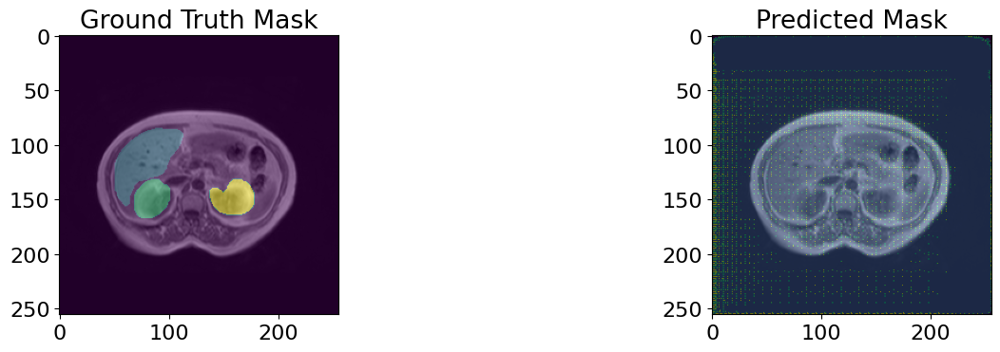

125/125 - 109s - loss: 1.5188 - accuracy: 0.7272 - mean_iou: 0.1701 - val_loss: 36.1524 - val_accuracy: 0.0299 - val_mean_iou: 0.0079 - lr: 0.0010 - 109s/epoch - 872ms/step
Epoch 2/1000


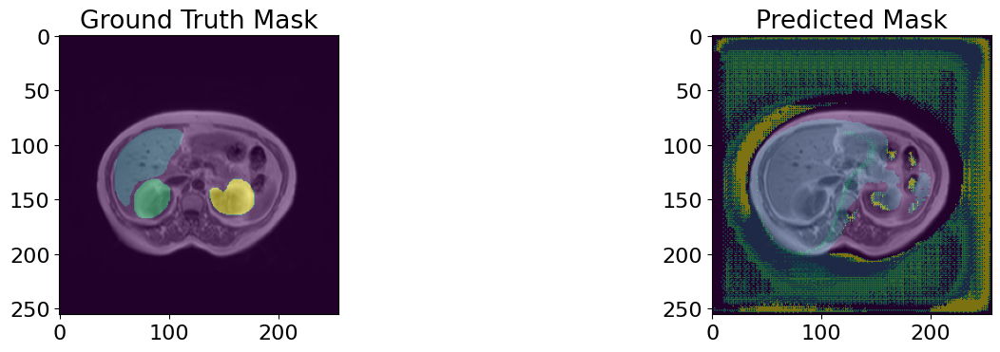

125/125 - 55s - loss: 1.2419 - accuracy: 0.9193 - mean_iou: 0.2356 - val_loss: 6.4375 - val_accuracy: 0.3272 - val_mean_iou: 0.0796 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 3/1000


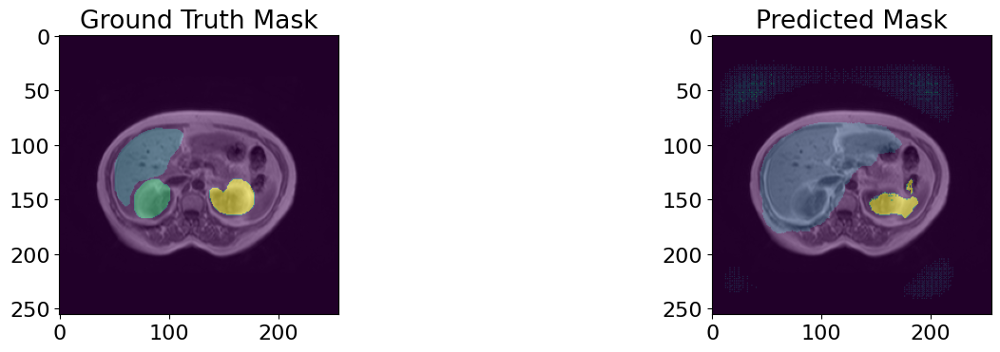

125/125 - 55s - loss: 1.0459 - accuracy: 0.9422 - mean_iou: 0.2818 - val_loss: 1.5366 - val_accuracy: 0.8676 - val_mean_iou: 0.2682 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 4/1000


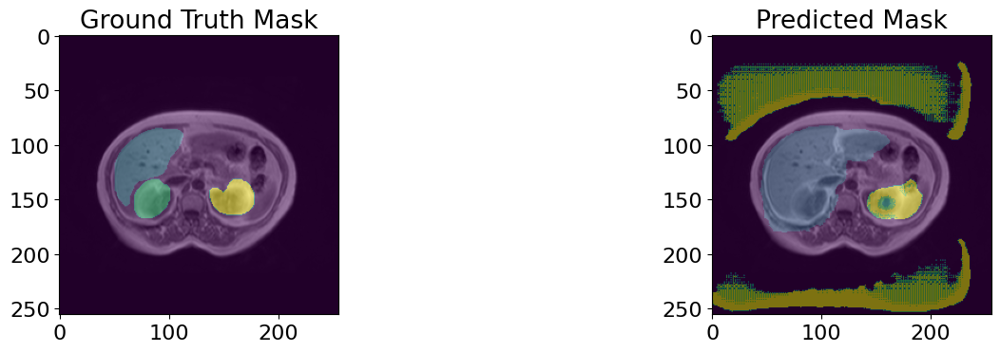

125/125 - 55s - loss: 0.8976 - accuracy: 0.9587 - mean_iou: 0.3442 - val_loss: 1.4547 - val_accuracy: 0.7474 - val_mean_iou: 0.2407 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 5/1000


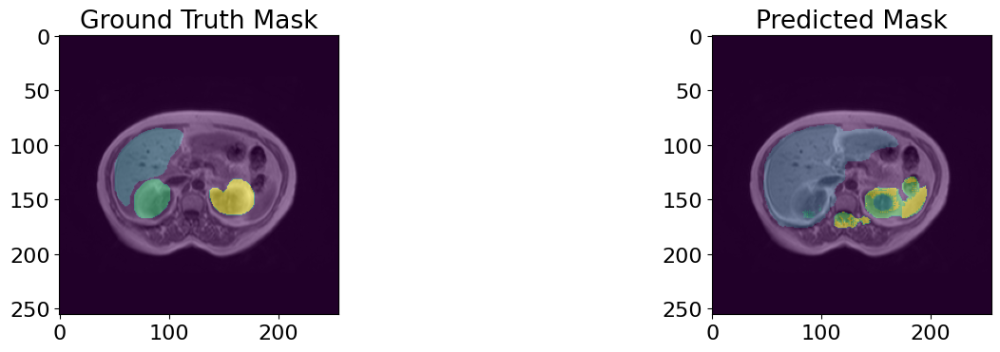

125/125 - 55s - loss: 0.7770 - accuracy: 0.9638 - mean_iou: 0.3682 - val_loss: 0.8449 - val_accuracy: 0.9567 - val_mean_iou: 0.3791 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 6/1000


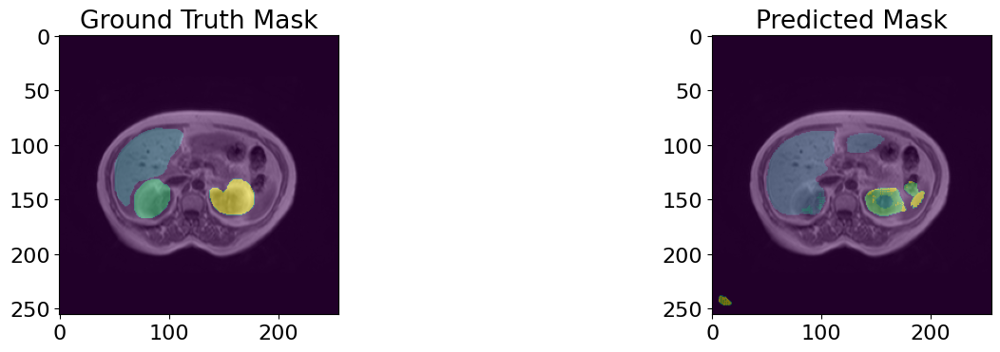

125/125 - 55s - loss: 0.6780 - accuracy: 0.9675 - mean_iou: 0.3860 - val_loss: 0.6321 - val_accuracy: 0.9732 - val_mean_iou: 0.4368 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 7/1000


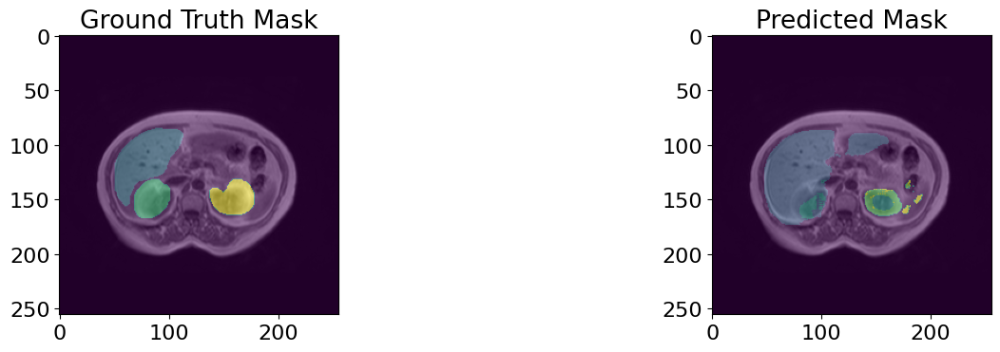

125/125 - 55s - loss: 0.5907 - accuracy: 0.9710 - mean_iou: 0.4259 - val_loss: 0.5688 - val_accuracy: 0.9744 - val_mean_iou: 0.4679 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 8/1000


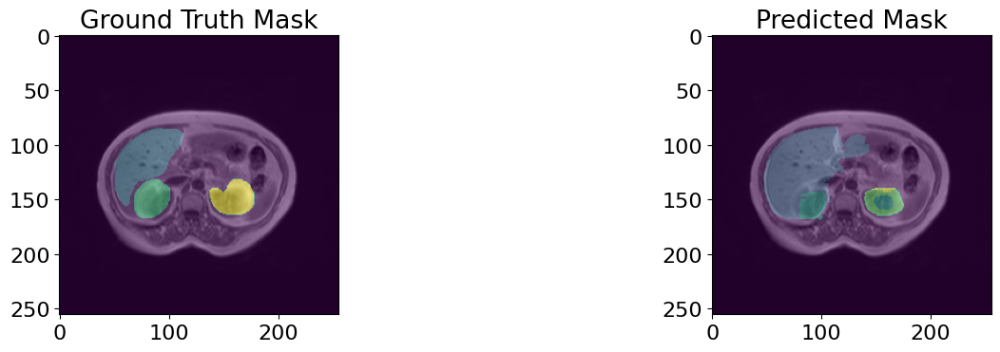

125/125 - 55s - loss: 0.5174 - accuracy: 0.9737 - mean_iou: 0.4798 - val_loss: 0.4953 - val_accuracy: 0.9771 - val_mean_iou: 0.5718 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 9/1000


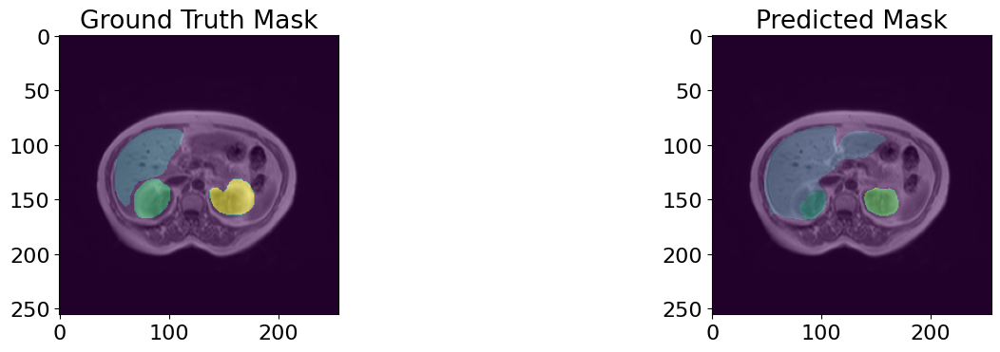

125/125 - 55s - loss: 0.4545 - accuracy: 0.9761 - mean_iou: 0.5254 - val_loss: 0.4453 - val_accuracy: 0.9791 - val_mean_iou: 0.6222 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 10/1000


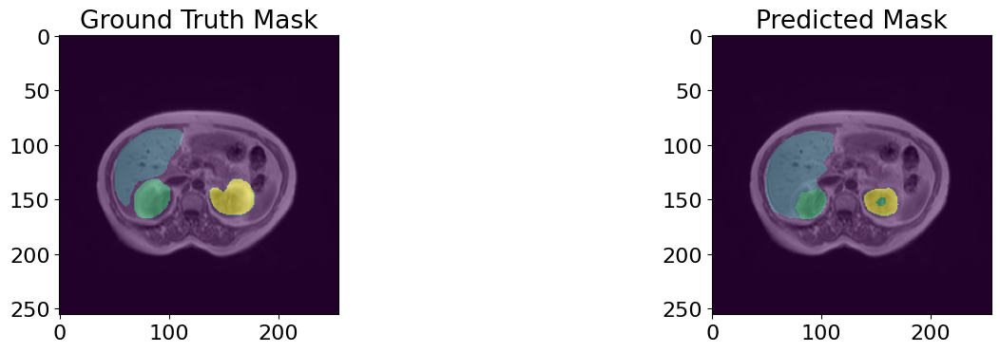

125/125 - 55s - loss: 0.4011 - accuracy: 0.9778 - mean_iou: 0.5665 - val_loss: 0.4103 - val_accuracy: 0.9772 - val_mean_iou: 0.5563 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 11/1000


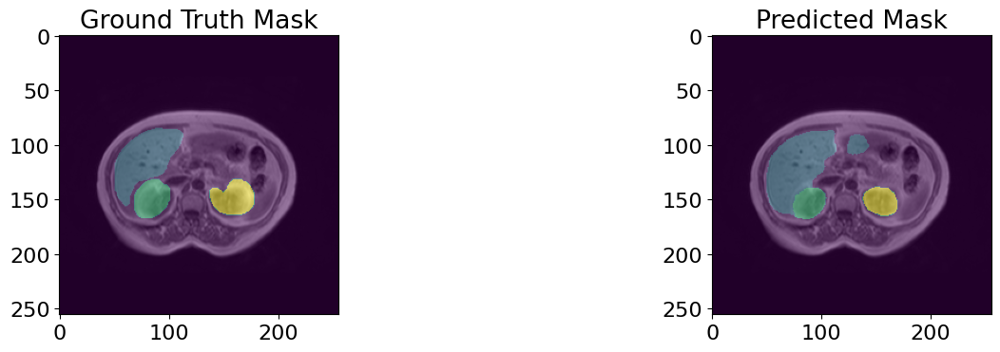

125/125 - 55s - loss: 0.3513 - accuracy: 0.9807 - mean_iou: 0.6093 - val_loss: 0.3351 - val_accuracy: 0.9826 - val_mean_iou: 0.6703 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 12/1000


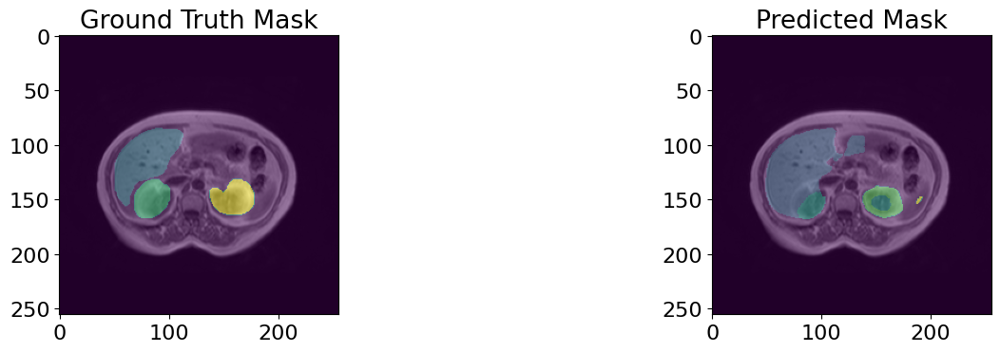

125/125 - 55s - loss: 0.3131 - accuracy: 0.9817 - mean_iou: 0.6256 - val_loss: 0.3145 - val_accuracy: 0.9813 - val_mean_iou: 0.6624 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 13/1000


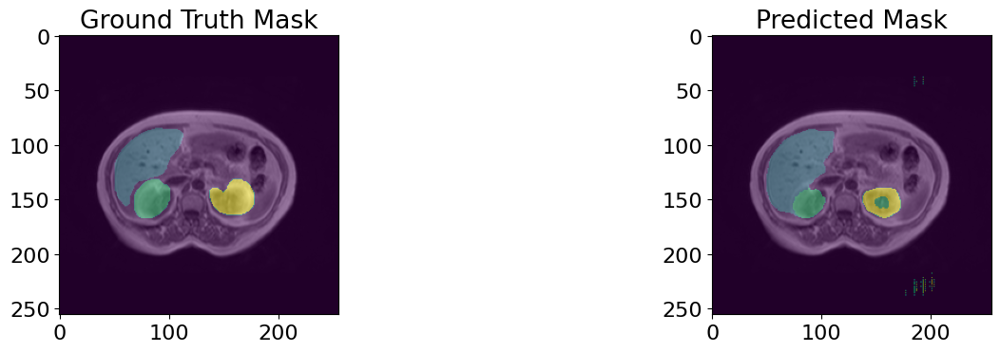

125/125 - 55s - loss: 0.2790 - accuracy: 0.9830 - mean_iou: 0.6547 - val_loss: 0.3071 - val_accuracy: 0.9721 - val_mean_iou: 0.5700 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 14/1000


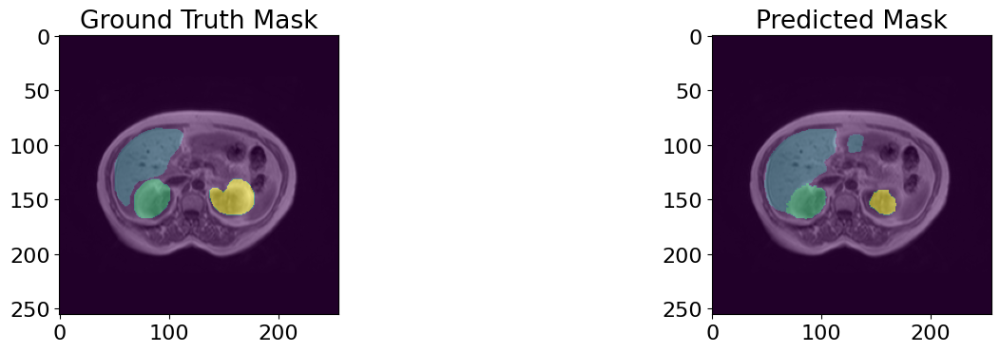

125/125 - 55s - loss: 0.2504 - accuracy: 0.9841 - mean_iou: 0.6707 - val_loss: 0.2551 - val_accuracy: 0.9830 - val_mean_iou: 0.6140 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 15/1000


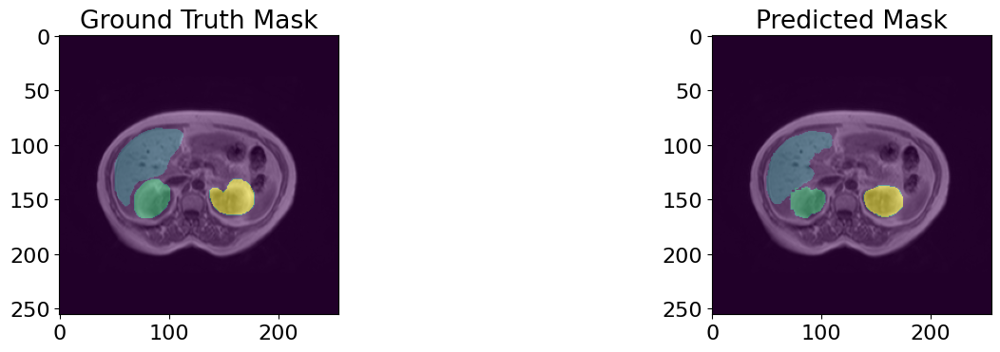

125/125 - 55s - loss: 0.2245 - accuracy: 0.9853 - mean_iou: 0.6934 - val_loss: 0.2233 - val_accuracy: 0.9841 - val_mean_iou: 0.6817 - lr: 0.0010 - 55s/epoch - 443ms/step
Epoch 16/1000


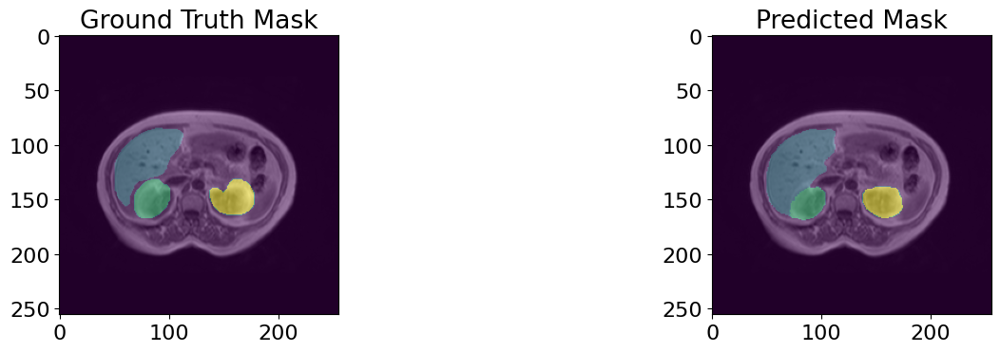

125/125 - 55s - loss: 0.2010 - accuracy: 0.9868 - mean_iou: 0.7225 - val_loss: 0.2165 - val_accuracy: 0.9830 - val_mean_iou: 0.7142 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 17/1000


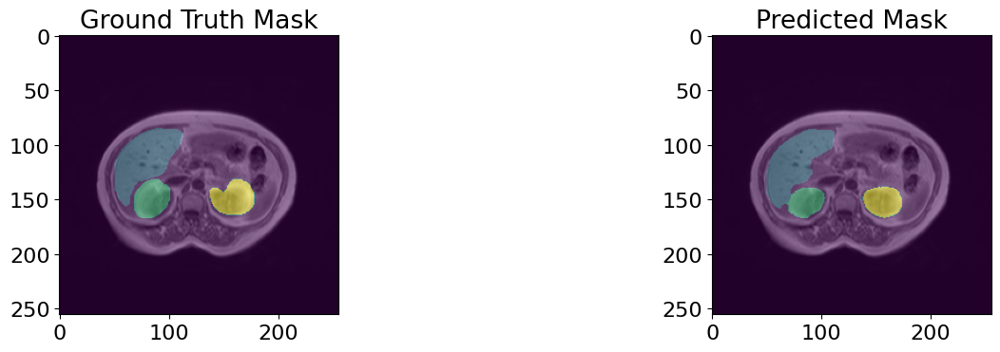

125/125 - 55s - loss: 0.1812 - accuracy: 0.9880 - mean_iou: 0.7445 - val_loss: 0.1821 - val_accuracy: 0.9850 - val_mean_iou: 0.7218 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 18/1000


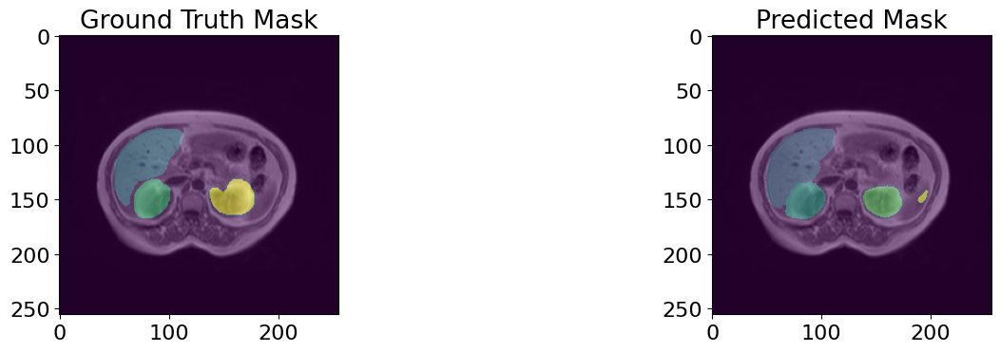

125/125 - 55s - loss: 0.1648 - accuracy: 0.9887 - mean_iou: 0.7567 - val_loss: 0.1703 - val_accuracy: 0.9860 - val_mean_iou: 0.7307 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 19/1000


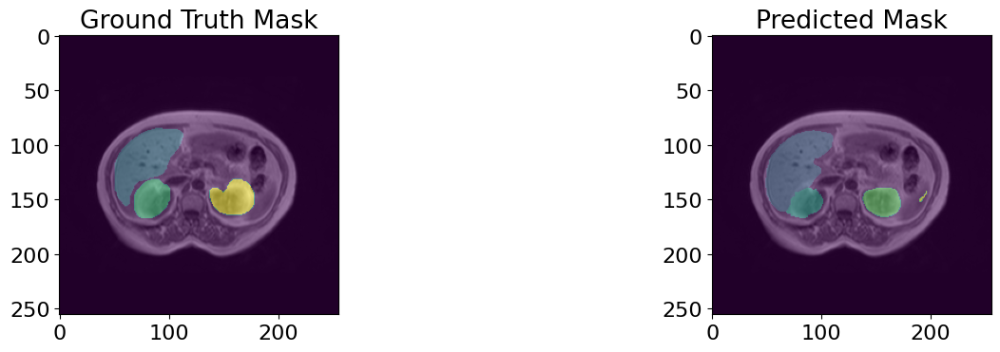

125/125 - 55s - loss: 0.1499 - accuracy: 0.9894 - mean_iou: 0.7729 - val_loss: 0.1600 - val_accuracy: 0.9855 - val_mean_iou: 0.7148 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 20/1000


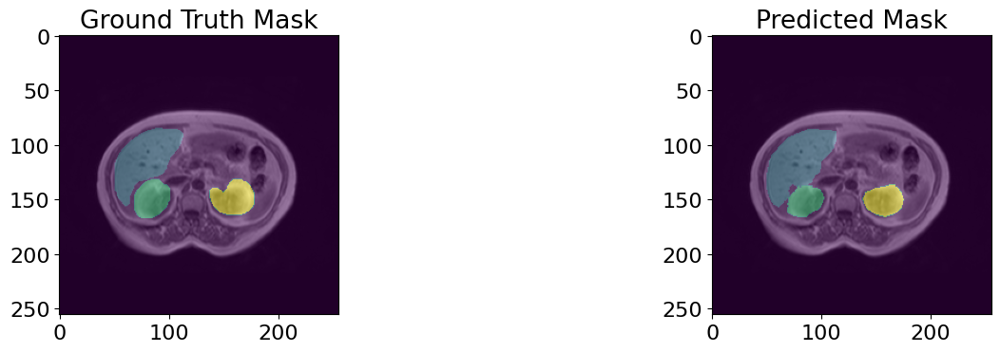

125/125 - 55s - loss: 0.1365 - accuracy: 0.9902 - mean_iou: 0.7886 - val_loss: 0.1459 - val_accuracy: 0.9861 - val_mean_iou: 0.7248 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 21/1000


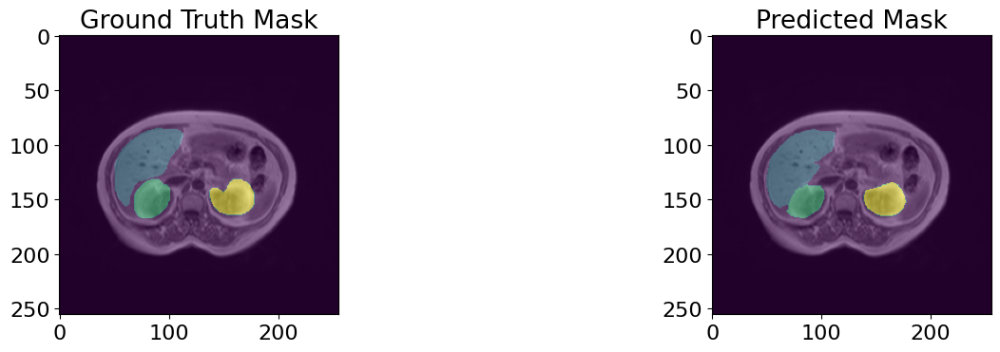

125/125 - 55s - loss: 0.1243 - accuracy: 0.9910 - mean_iou: 0.8084 - val_loss: 0.1332 - val_accuracy: 0.9868 - val_mean_iou: 0.7463 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 22/1000


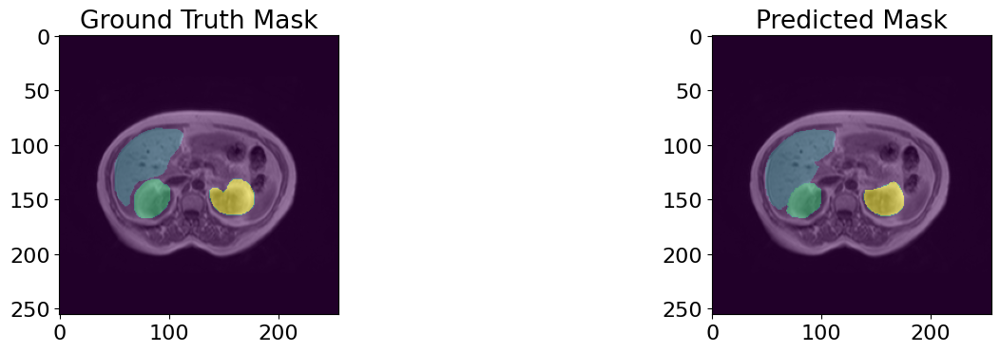

125/125 - 55s - loss: 0.1138 - accuracy: 0.9916 - mean_iou: 0.8195 - val_loss: 0.1308 - val_accuracy: 0.9864 - val_mean_iou: 0.7502 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 23/1000


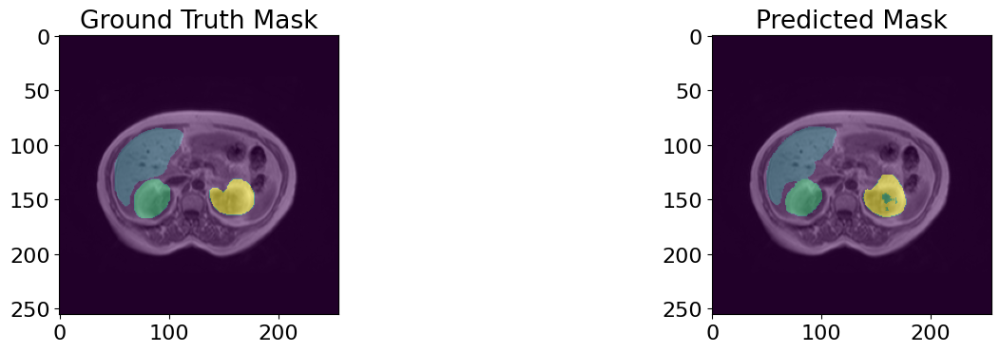

125/125 - 55s - loss: 0.1060 - accuracy: 0.9916 - mean_iou: 0.8187 - val_loss: 0.1287 - val_accuracy: 0.9861 - val_mean_iou: 0.7433 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 24/1000


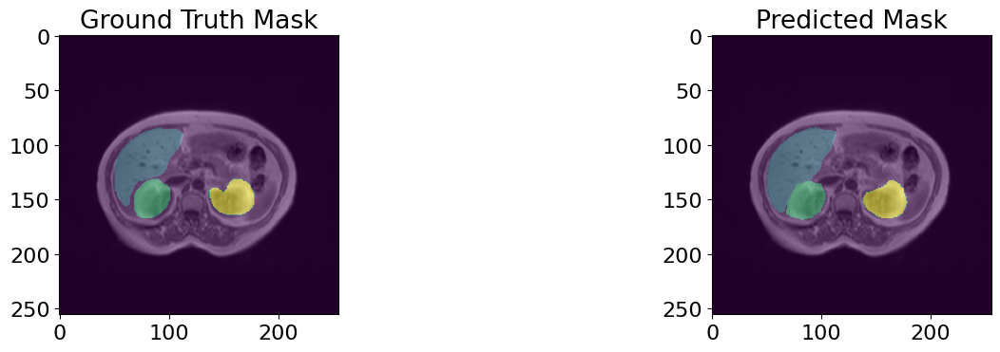

125/125 - 55s - loss: 0.0955 - accuracy: 0.9929 - mean_iou: 0.8445 - val_loss: 0.1151 - val_accuracy: 0.9871 - val_mean_iou: 0.7604 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 25/1000


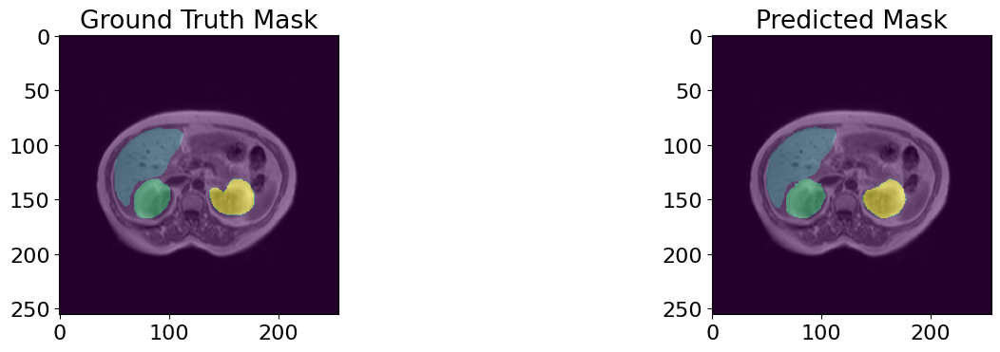

125/125 - 55s - loss: 0.0881 - accuracy: 0.9933 - mean_iou: 0.8530 - val_loss: 0.1063 - val_accuracy: 0.9875 - val_mean_iou: 0.7636 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 26/1000


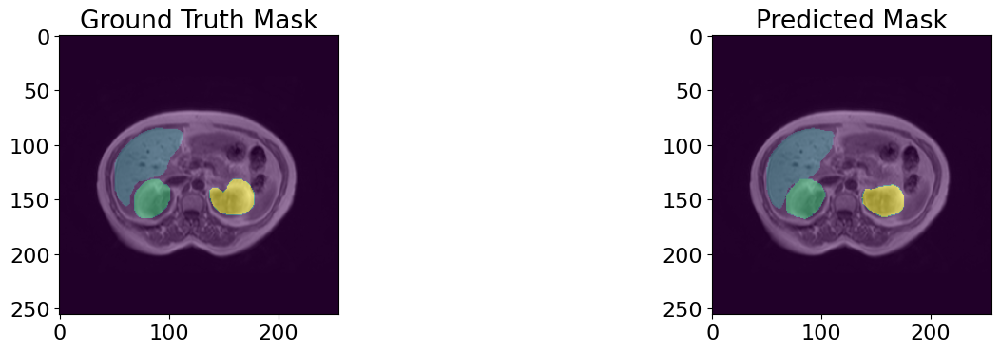

125/125 - 55s - loss: 0.0820 - accuracy: 0.9935 - mean_iou: 0.8594 - val_loss: 0.1045 - val_accuracy: 0.9868 - val_mean_iou: 0.7557 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 27/1000


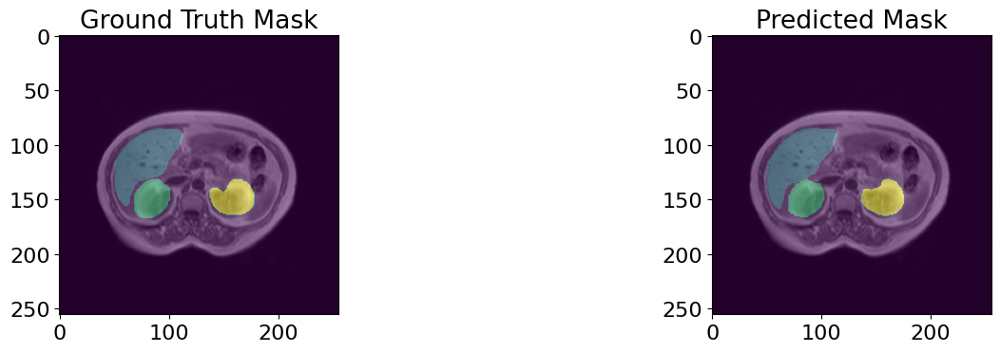

125/125 - 55s - loss: 0.0764 - accuracy: 0.9937 - mean_iou: 0.8636 - val_loss: 0.0948 - val_accuracy: 0.9877 - val_mean_iou: 0.7648 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 28/1000


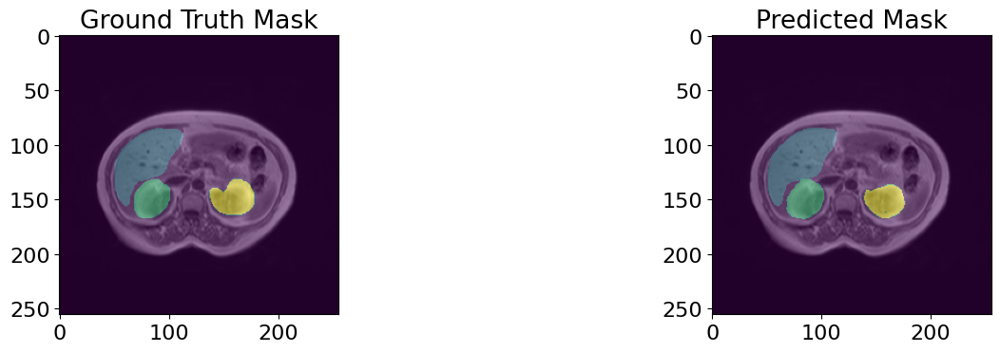

125/125 - 55s - loss: 0.0702 - accuracy: 0.9942 - mean_iou: 0.8767 - val_loss: 0.0934 - val_accuracy: 0.9877 - val_mean_iou: 0.7693 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 29/1000


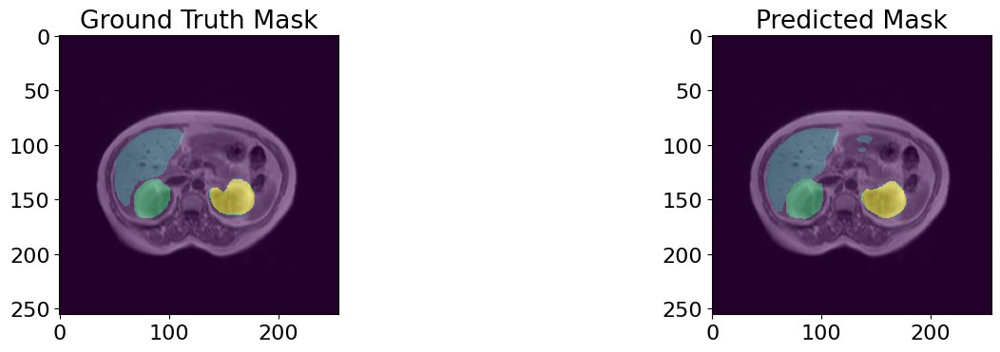

125/125 - 55s - loss: 0.0661 - accuracy: 0.9942 - mean_iou: 0.8739 - val_loss: 0.1044 - val_accuracy: 0.9862 - val_mean_iou: 0.7530 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 30/1000


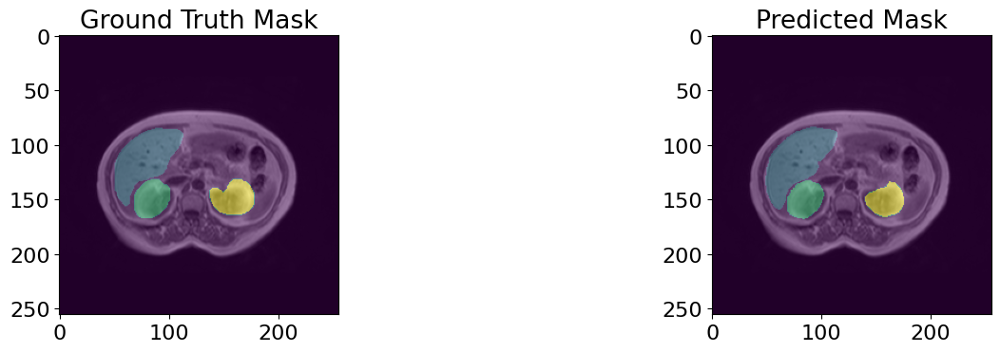

125/125 - 55s - loss: 0.0620 - accuracy: 0.9944 - mean_iou: 0.8774 - val_loss: 0.0840 - val_accuracy: 0.9876 - val_mean_iou: 0.7690 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 31/1000


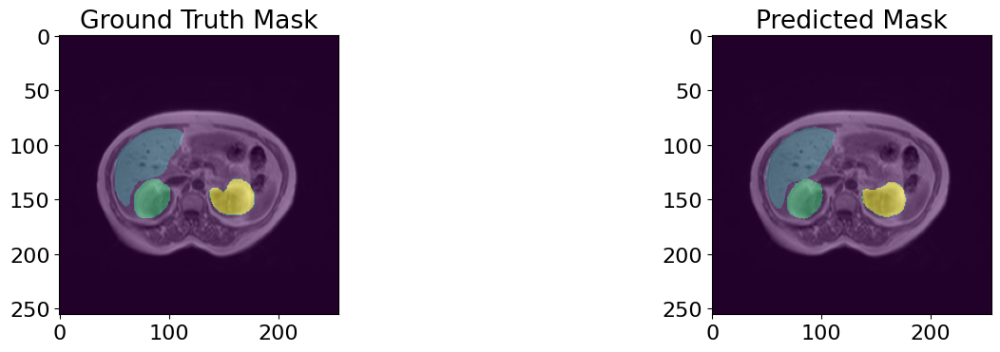

125/125 - 55s - loss: 0.0558 - accuracy: 0.9954 - mean_iou: 0.8993 - val_loss: 0.0817 - val_accuracy: 0.9879 - val_mean_iou: 0.7805 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 32/1000


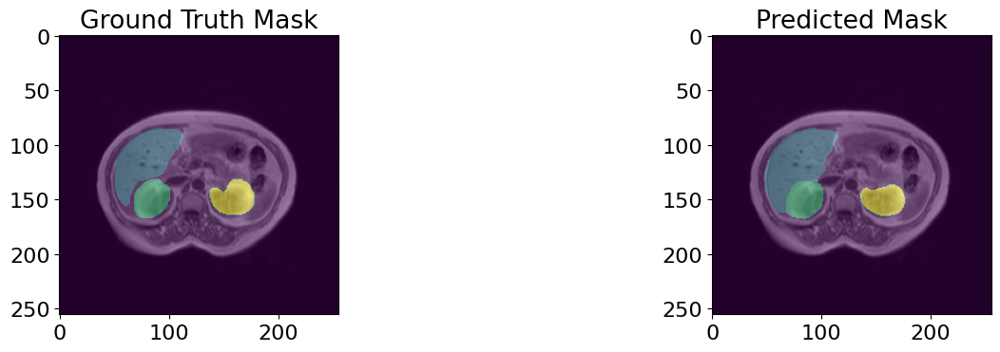

125/125 - 56s - loss: 0.0532 - accuracy: 0.9953 - mean_iou: 0.8938 - val_loss: 0.0842 - val_accuracy: 0.9877 - val_mean_iou: 0.7803 - lr: 0.0010 - 56s/epoch - 444ms/step
Epoch 33/1000


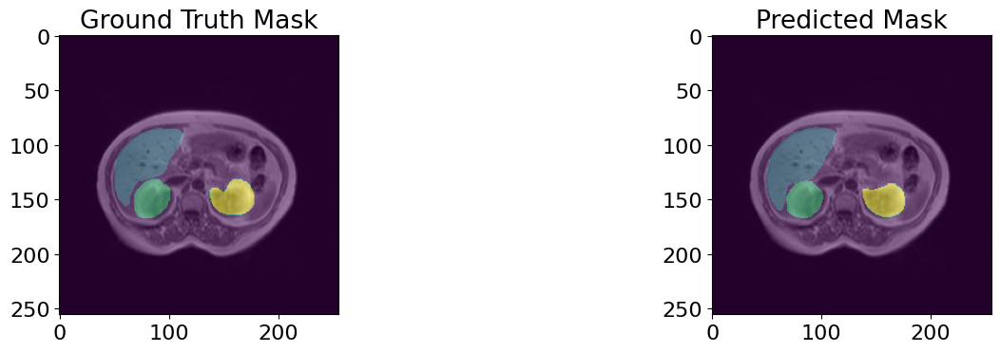

125/125 - 55s - loss: 0.0495 - accuracy: 0.9955 - mean_iou: 0.9022 - val_loss: 0.0757 - val_accuracy: 0.9881 - val_mean_iou: 0.7706 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 34/1000


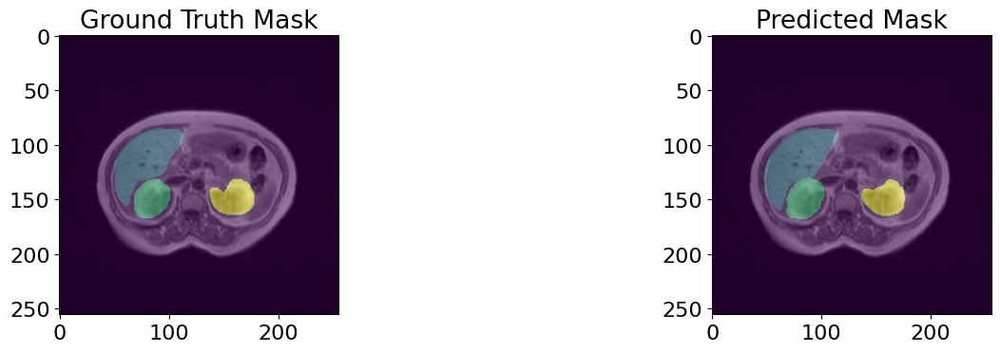

125/125 - 55s - loss: 0.0465 - accuracy: 0.9957 - mean_iou: 0.9079 - val_loss: 0.0758 - val_accuracy: 0.9877 - val_mean_iou: 0.7745 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 35/1000


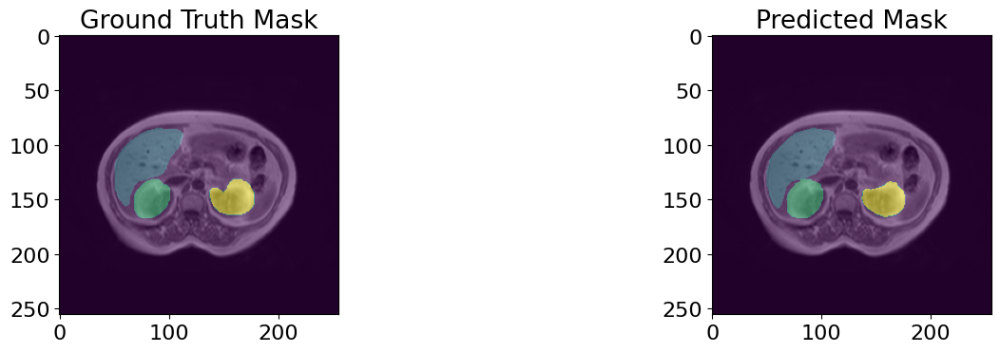

125/125 - 55s - loss: 0.0431 - accuracy: 0.9961 - mean_iou: 0.9141 - val_loss: 0.0721 - val_accuracy: 0.9882 - val_mean_iou: 0.7764 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 36/1000


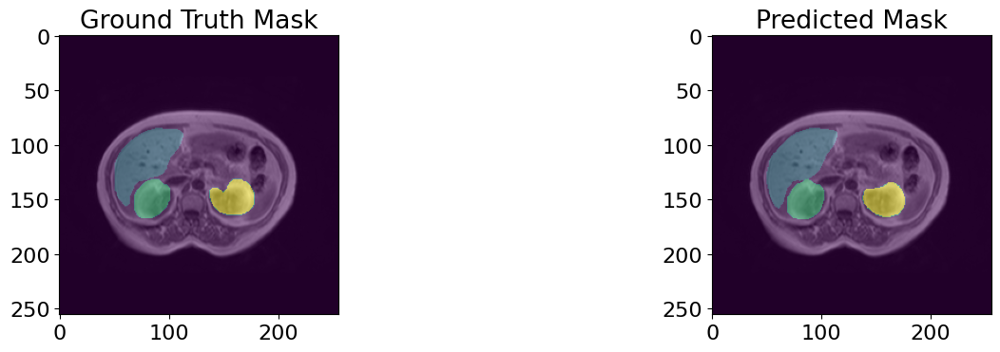

125/125 - 55s - loss: 0.0395 - accuracy: 0.9966 - mean_iou: 0.9245 - val_loss: 0.0714 - val_accuracy: 0.9885 - val_mean_iou: 0.7862 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 37/1000


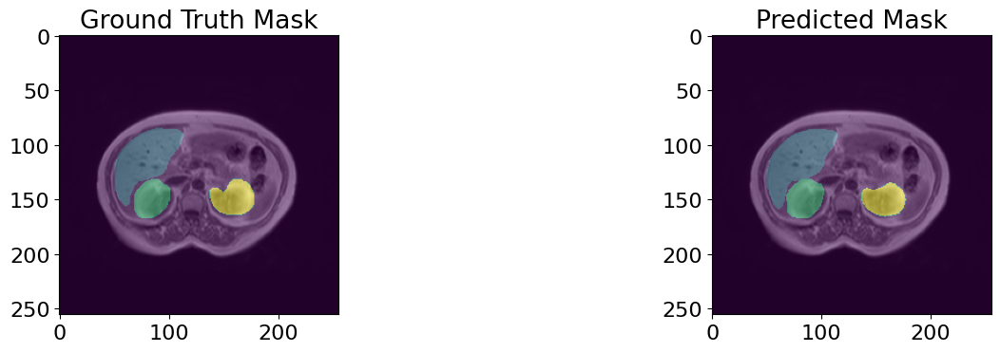

125/125 - 55s - loss: 0.0372 - accuracy: 0.9967 - mean_iou: 0.9252 - val_loss: 0.0747 - val_accuracy: 0.9884 - val_mean_iou: 0.7834 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 38/1000


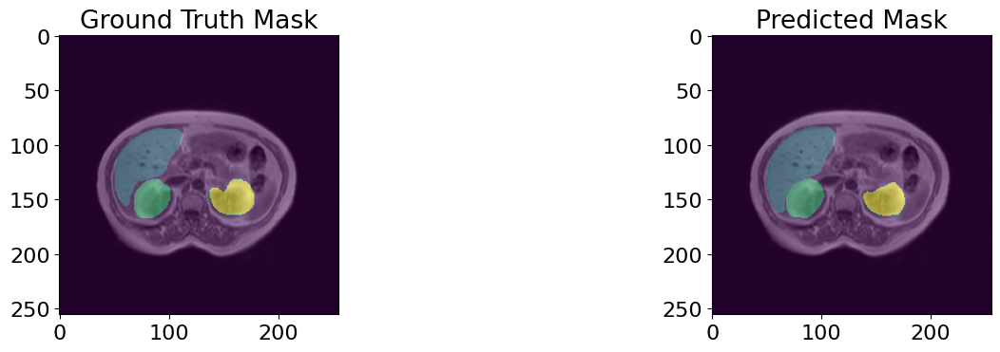

125/125 - 55s - loss: 0.0355 - accuracy: 0.9966 - mean_iou: 0.9257 - val_loss: 0.0708 - val_accuracy: 0.9876 - val_mean_iou: 0.7705 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 39/1000


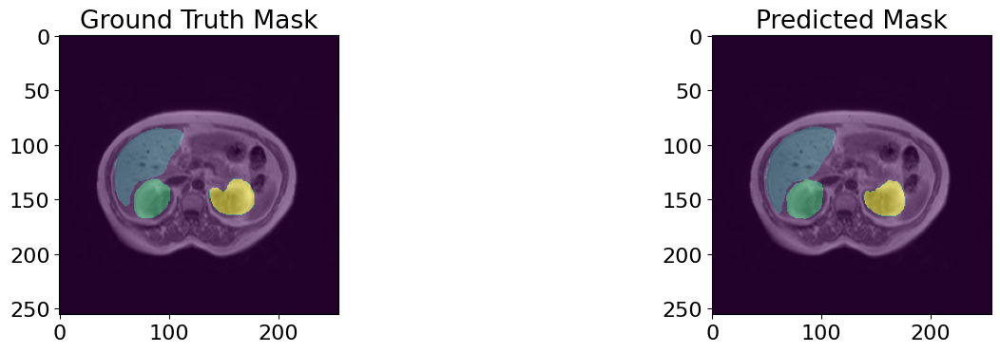

125/125 - 55s - loss: 0.0353 - accuracy: 0.9960 - mean_iou: 0.9174 - val_loss: 0.0653 - val_accuracy: 0.9881 - val_mean_iou: 0.7769 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 40/1000


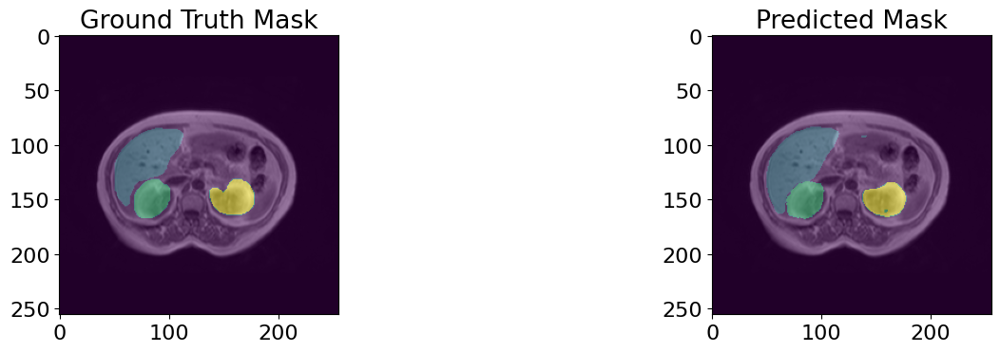

125/125 - 55s - loss: 0.0329 - accuracy: 0.9963 - mean_iou: 0.9184 - val_loss: 0.0676 - val_accuracy: 0.9876 - val_mean_iou: 0.7732 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 41/1000


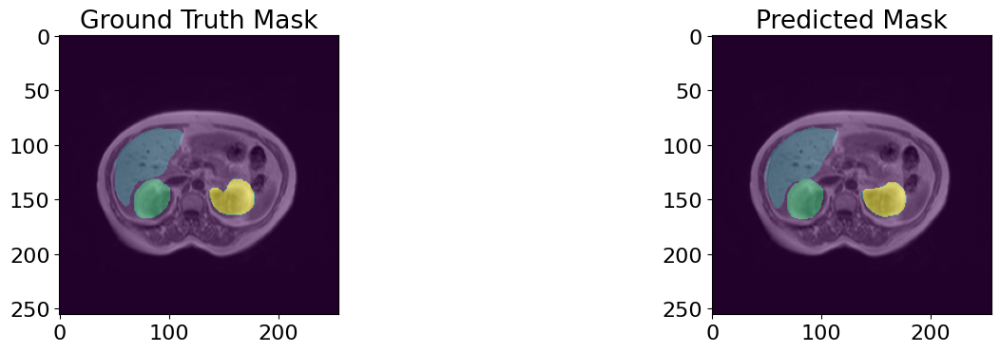

125/125 - 55s - loss: 0.0303 - accuracy: 0.9968 - mean_iou: 0.9257 - val_loss: 0.0593 - val_accuracy: 0.9888 - val_mean_iou: 0.7877 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 42/1000


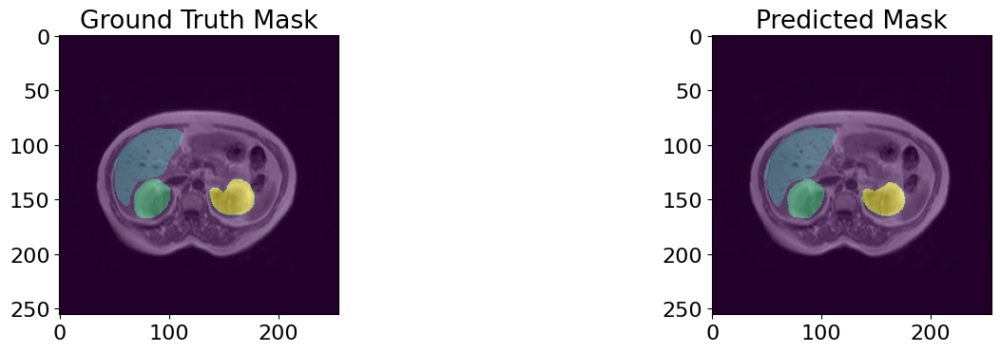

125/125 - 55s - loss: 0.0277 - accuracy: 0.9972 - mean_iou: 0.9350 - val_loss: 0.0622 - val_accuracy: 0.9881 - val_mean_iou: 0.7692 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 43/1000


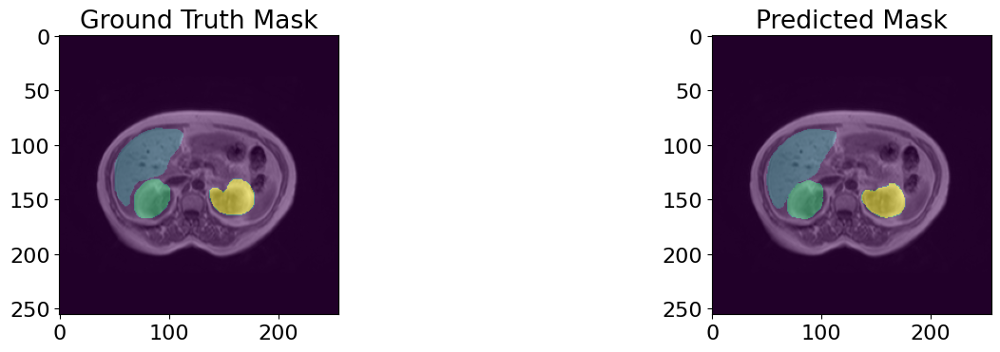

125/125 - 55s - loss: 0.0265 - accuracy: 0.9971 - mean_iou: 0.9366 - val_loss: 0.0614 - val_accuracy: 0.9881 - val_mean_iou: 0.7794 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 44/1000


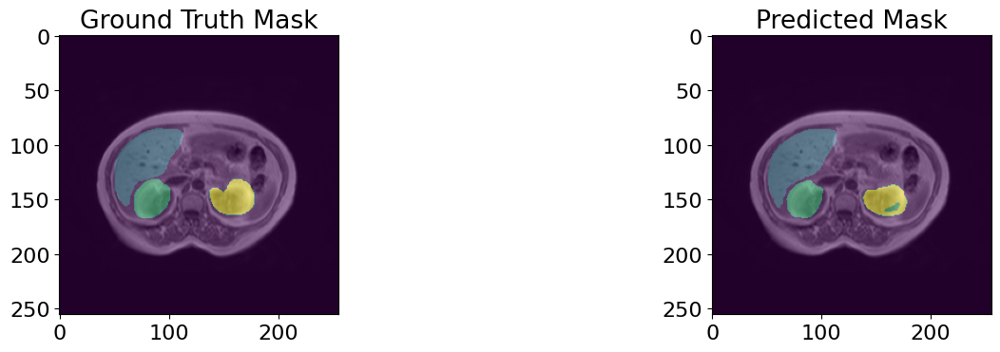

125/125 - 55s - loss: 0.0307 - accuracy: 0.9951 - mean_iou: 0.8908 - val_loss: 0.0602 - val_accuracy: 0.9875 - val_mean_iou: 0.7600 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 45/1000


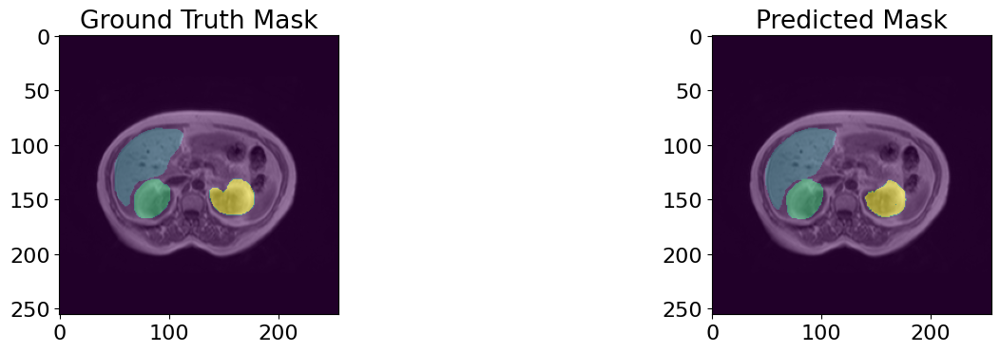

125/125 - 55s - loss: 0.0285 - accuracy: 0.9955 - mean_iou: 0.8937 - val_loss: 0.0546 - val_accuracy: 0.9884 - val_mean_iou: 0.7924 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 46/1000


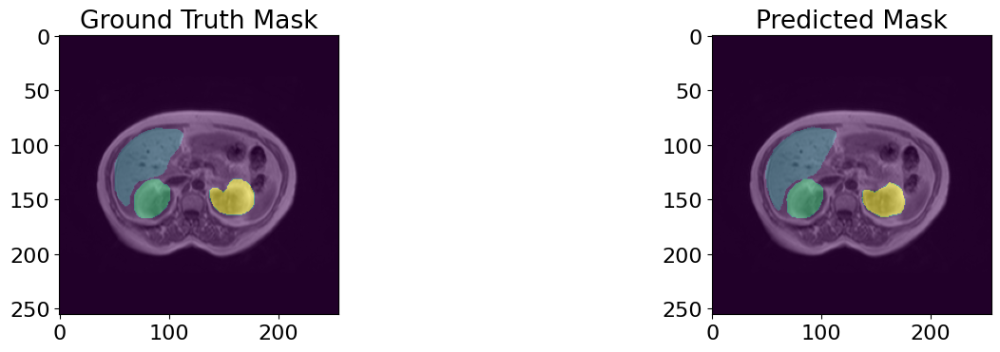

125/125 - 55s - loss: 0.0229 - accuracy: 0.9972 - mean_iou: 0.9369 - val_loss: 0.0536 - val_accuracy: 0.9887 - val_mean_iou: 0.7936 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 47/1000


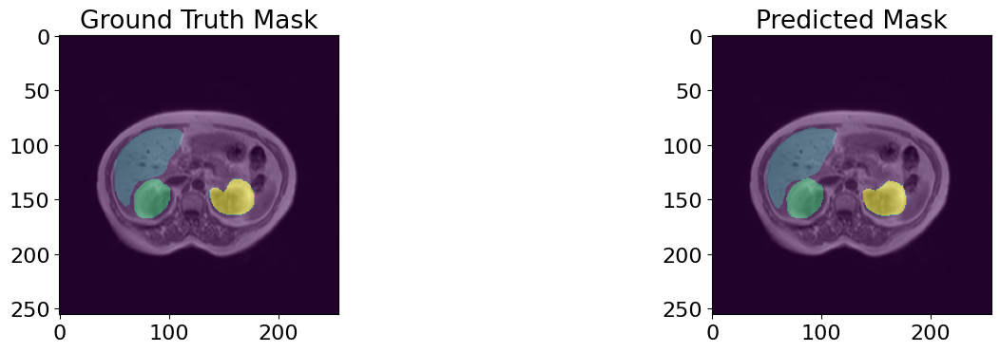

125/125 - 55s - loss: 0.0206 - accuracy: 0.9977 - mean_iou: 0.9493 - val_loss: 0.0527 - val_accuracy: 0.9887 - val_mean_iou: 0.7949 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 48/1000


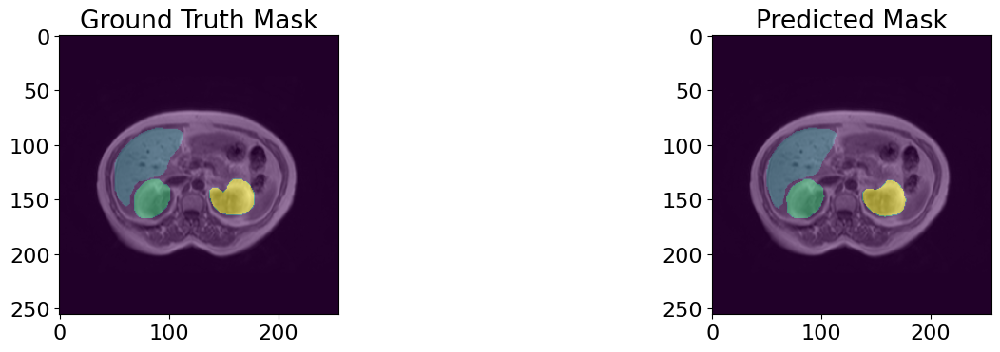

125/125 - 55s - loss: 0.0190 - accuracy: 0.9981 - mean_iou: 0.9559 - val_loss: 0.0534 - val_accuracy: 0.9888 - val_mean_iou: 0.7959 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 49/1000


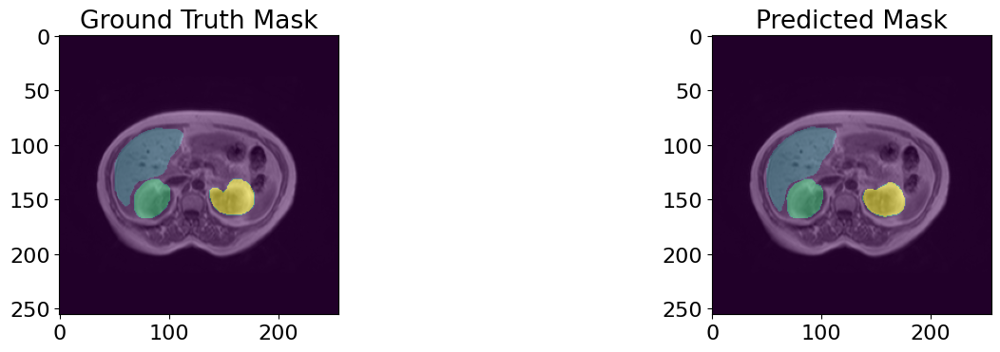

125/125 - 55s - loss: 0.0179 - accuracy: 0.9982 - mean_iou: 0.9576 - val_loss: 0.0546 - val_accuracy: 0.9887 - val_mean_iou: 0.7932 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 50/1000


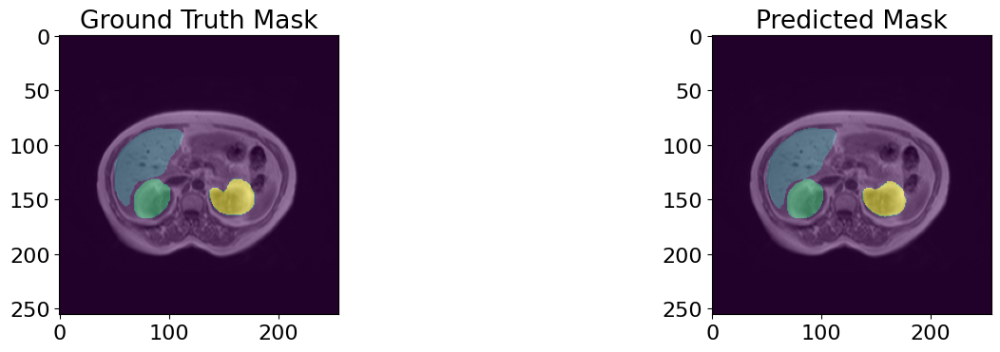

125/125 - 55s - loss: 0.0170 - accuracy: 0.9982 - mean_iou: 0.9590 - val_loss: 0.0531 - val_accuracy: 0.9887 - val_mean_iou: 0.7967 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 51/1000


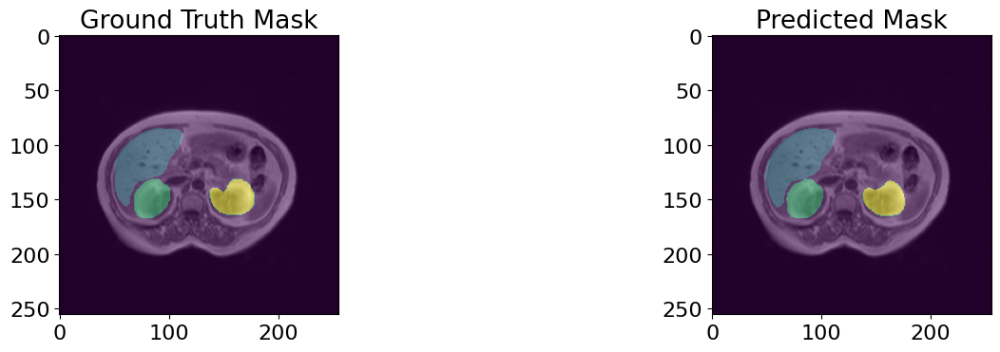

125/125 - 55s - loss: 0.0160 - accuracy: 0.9983 - mean_iou: 0.9613 - val_loss: 0.0539 - val_accuracy: 0.9888 - val_mean_iou: 0.7970 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 52/1000


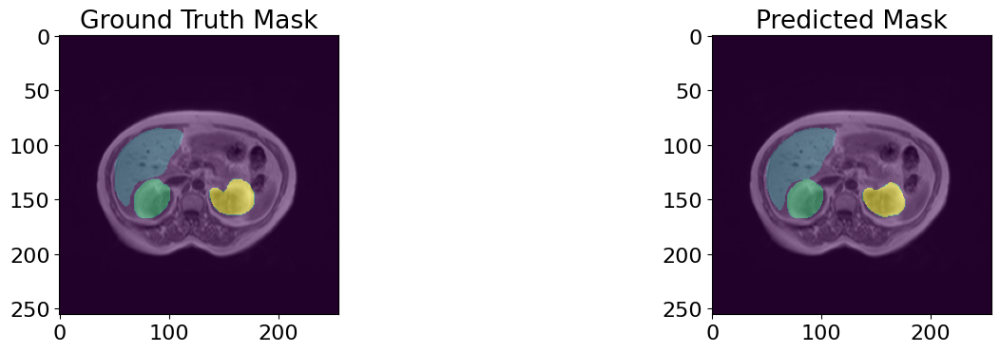

125/125 - 55s - loss: 0.0153 - accuracy: 0.9983 - mean_iou: 0.9624 - val_loss: 0.0540 - val_accuracy: 0.9888 - val_mean_iou: 0.7943 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 53/1000


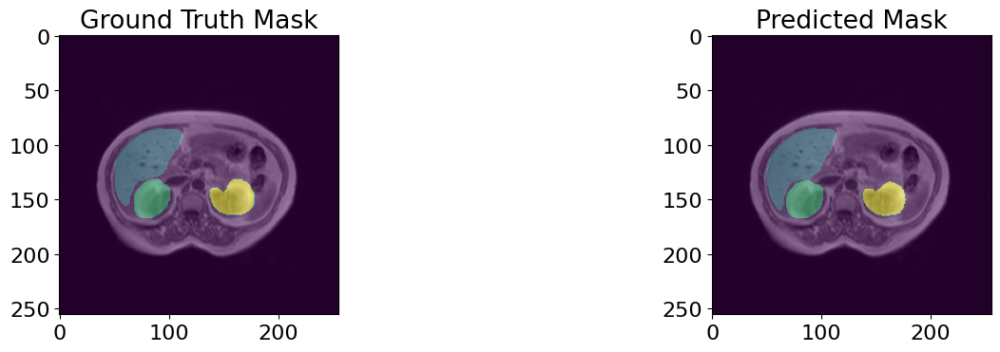

125/125 - 55s - loss: 0.0148 - accuracy: 0.9983 - mean_iou: 0.9604 - val_loss: 0.0561 - val_accuracy: 0.9885 - val_mean_iou: 0.7896 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 54/1000


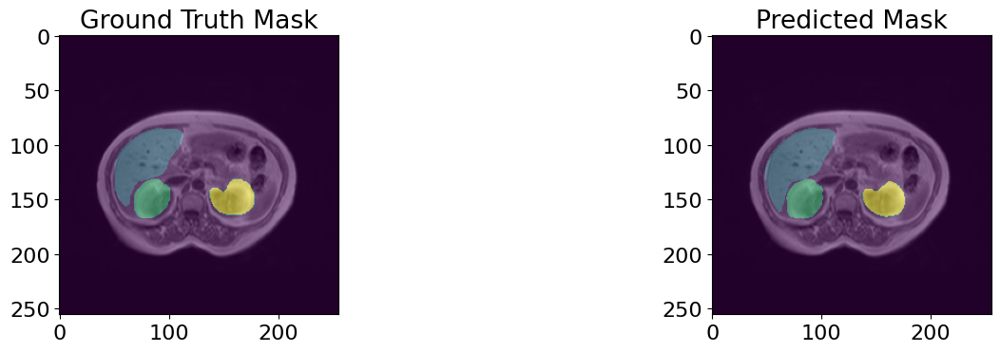

125/125 - 55s - loss: 0.0141 - accuracy: 0.9983 - mean_iou: 0.9615 - val_loss: 0.0561 - val_accuracy: 0.9884 - val_mean_iou: 0.7860 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 55/1000


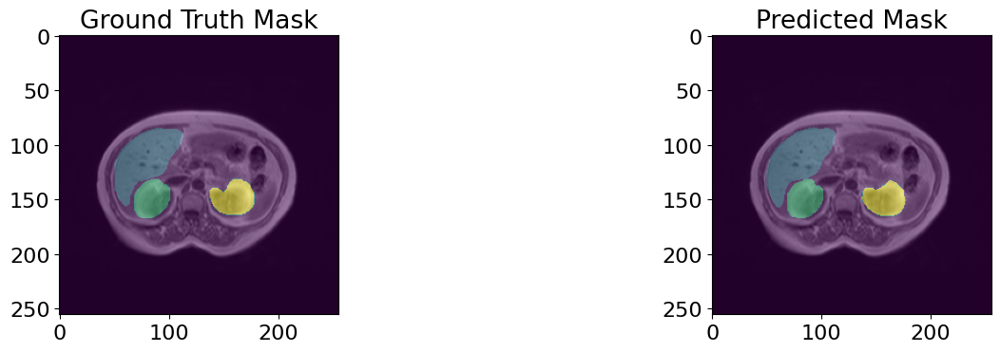

125/125 - 55s - loss: 0.0133 - accuracy: 0.9984 - mean_iou: 0.9648 - val_loss: 0.0531 - val_accuracy: 0.9888 - val_mean_iou: 0.7962 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 56/1000


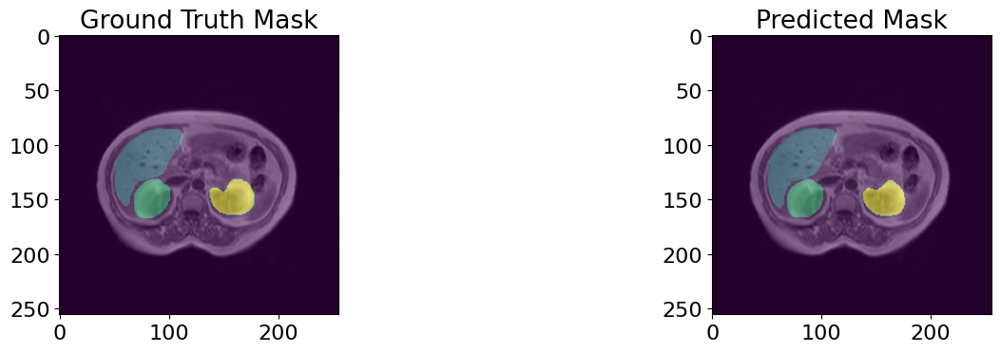

125/125 - 55s - loss: 0.0127 - accuracy: 0.9985 - mean_iou: 0.9649 - val_loss: 0.0530 - val_accuracy: 0.9887 - val_mean_iou: 0.7915 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 57/1000


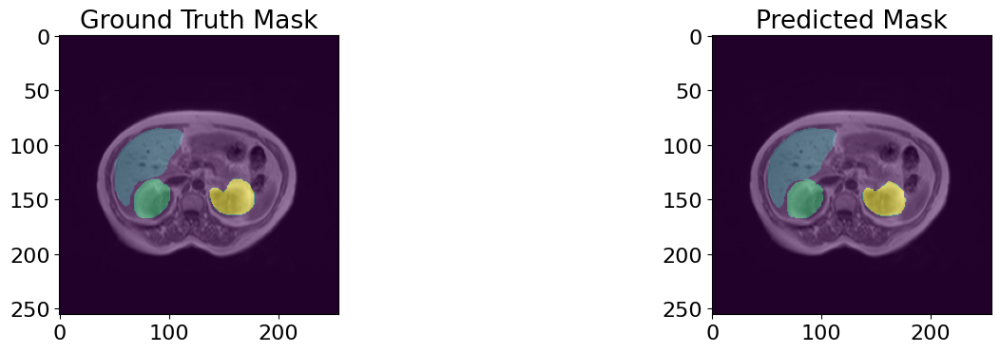

125/125 - 55s - loss: 0.0120 - accuracy: 0.9986 - mean_iou: 0.9675 - val_loss: 0.0527 - val_accuracy: 0.9888 - val_mean_iou: 0.7943 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 58/1000


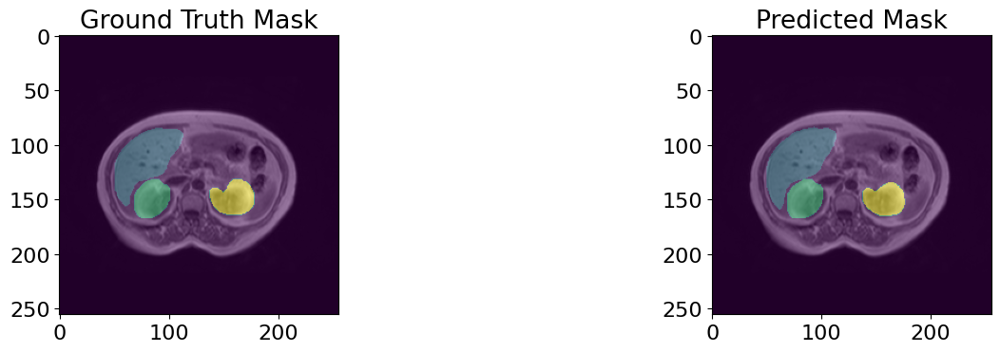

125/125 - 55s - loss: 0.0116 - accuracy: 0.9986 - mean_iou: 0.9673 - val_loss: 0.0557 - val_accuracy: 0.9885 - val_mean_iou: 0.7864 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 59/1000


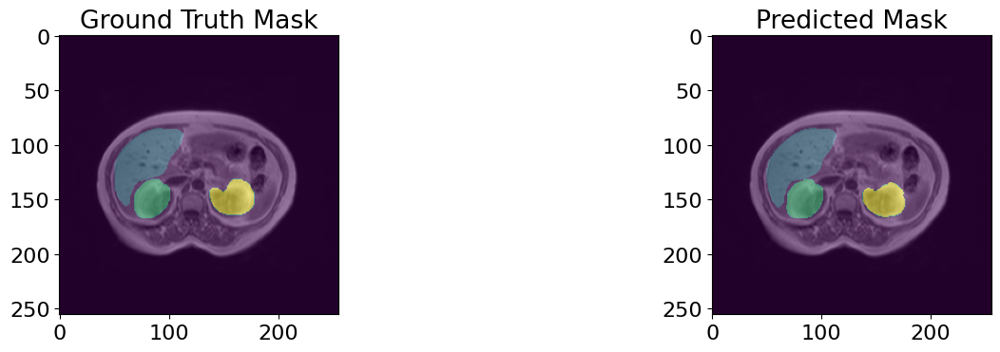

125/125 - 55s - loss: 0.0112 - accuracy: 0.9985 - mean_iou: 0.9666 - val_loss: 0.0514 - val_accuracy: 0.9888 - val_mean_iou: 0.7961 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 60/1000


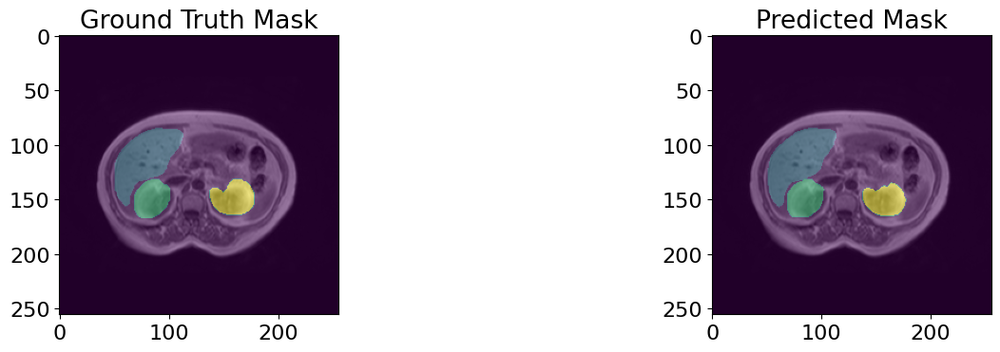

125/125 - 55s - loss: 0.0109 - accuracy: 0.9985 - mean_iou: 0.9666 - val_loss: 0.0534 - val_accuracy: 0.9884 - val_mean_iou: 0.7865 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 61/1000


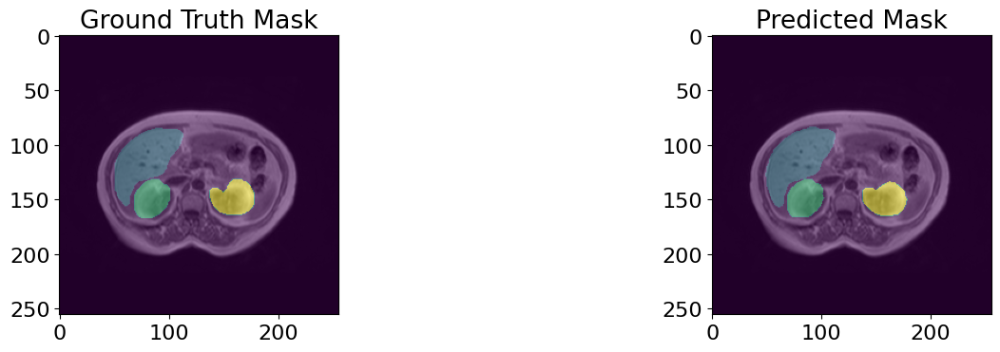

125/125 - 55s - loss: 0.0104 - accuracy: 0.9986 - mean_iou: 0.9679 - val_loss: 0.0515 - val_accuracy: 0.9891 - val_mean_iou: 0.7992 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 62/1000


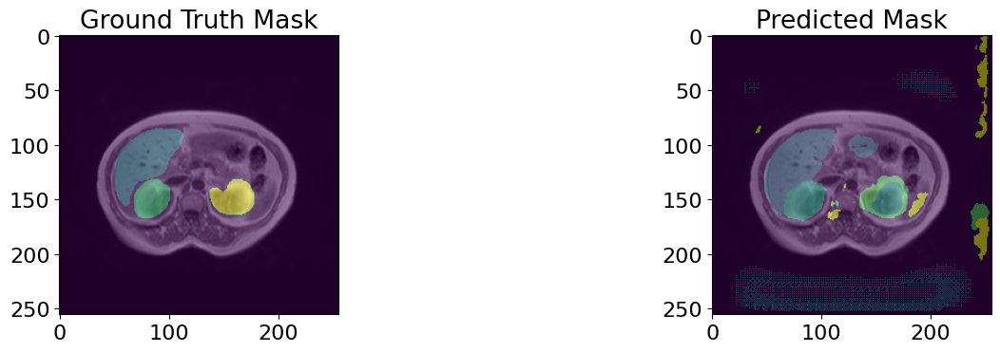

125/125 - 55s - loss: 0.0257 - accuracy: 0.9928 - mean_iou: 0.8437 - val_loss: 0.4828 - val_accuracy: 0.9138 - val_mean_iou: 0.4676 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 63/1000


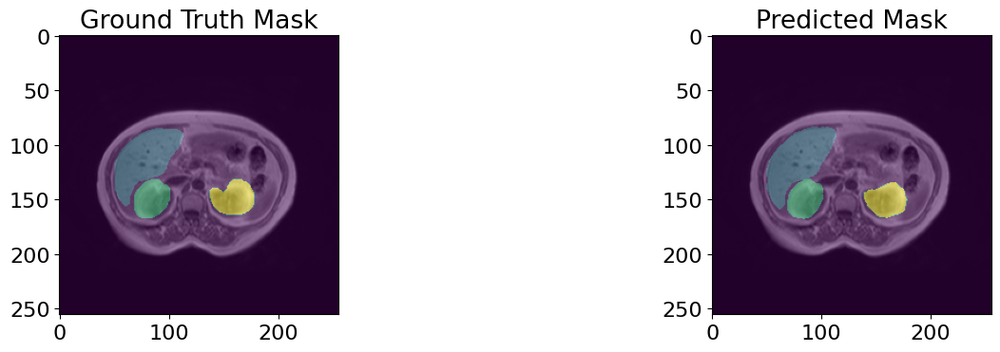

125/125 - 55s - loss: 0.0228 - accuracy: 0.9935 - mean_iou: 0.8564 - val_loss: 0.0475 - val_accuracy: 0.9866 - val_mean_iou: 0.7530 - lr: 0.0010 - 55s/epoch - 444ms/step
Epoch 64/1000


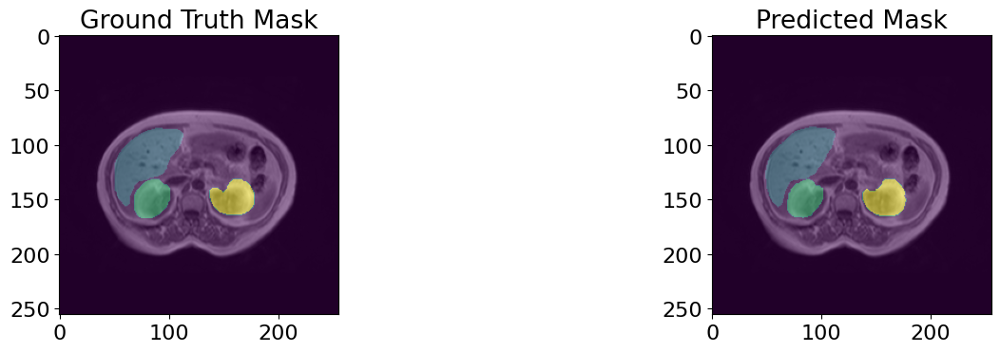

125/125 - 55s - loss: 0.0173 - accuracy: 0.9955 - mean_iou: 0.9045 - val_loss: 0.0385 - val_accuracy: 0.9888 - val_mean_iou: 0.7791 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 65/1000


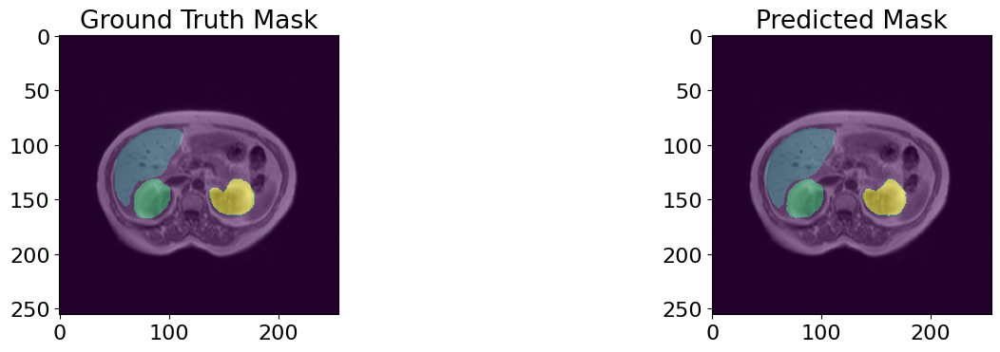

125/125 - 55s - loss: 0.0125 - accuracy: 0.9973 - mean_iou: 0.9411 - val_loss: 0.0385 - val_accuracy: 0.9889 - val_mean_iou: 0.7968 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 66/1000


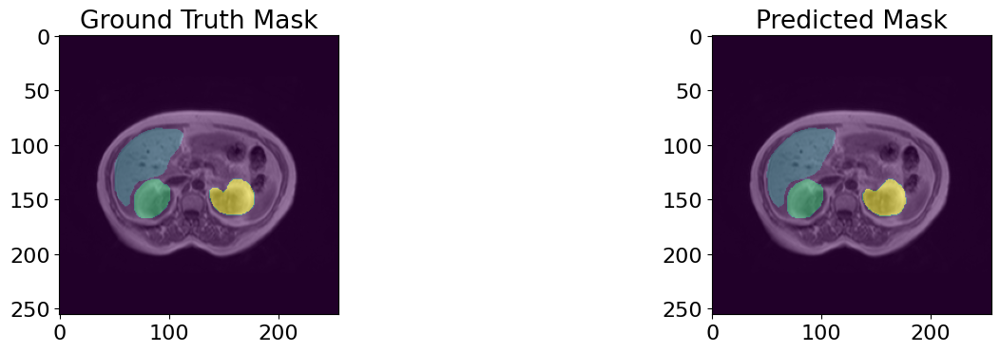

125/125 - 55s - loss: 0.0103 - accuracy: 0.9981 - mean_iou: 0.9586 - val_loss: 0.0417 - val_accuracy: 0.9888 - val_mean_iou: 0.7936 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 67/1000


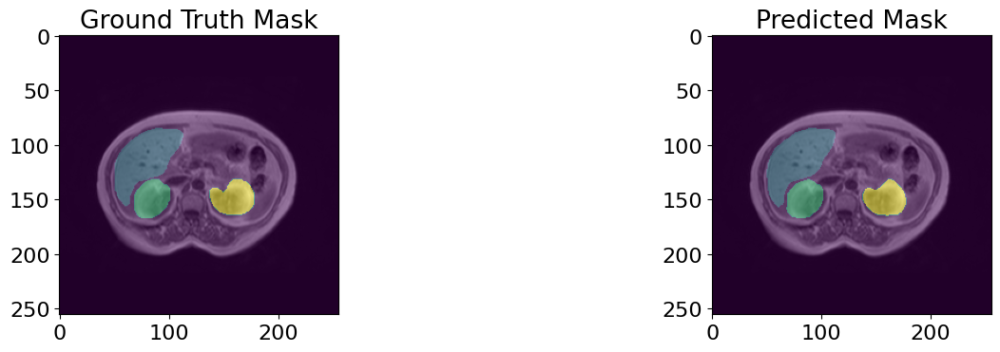

125/125 - 55s - loss: 0.0089 - accuracy: 0.9986 - mean_iou: 0.9670 - val_loss: 0.0423 - val_accuracy: 0.9889 - val_mean_iou: 0.7968 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 68/1000


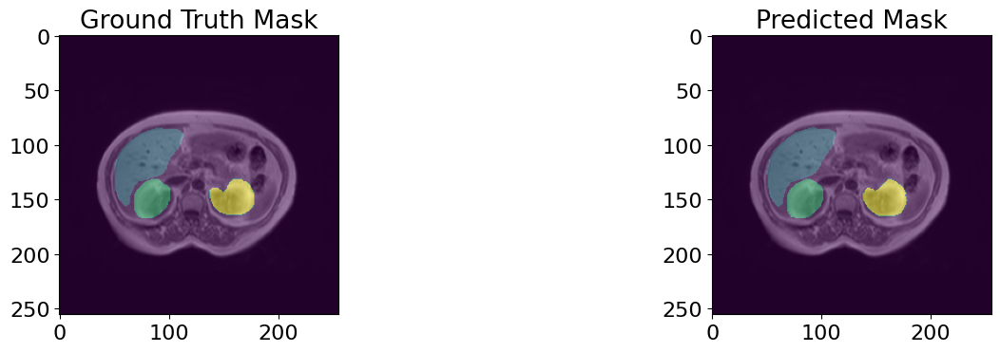

125/125 - 55s - loss: 0.0083 - accuracy: 0.9987 - mean_iou: 0.9715 - val_loss: 0.0445 - val_accuracy: 0.9888 - val_mean_iou: 0.7945 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 69/1000


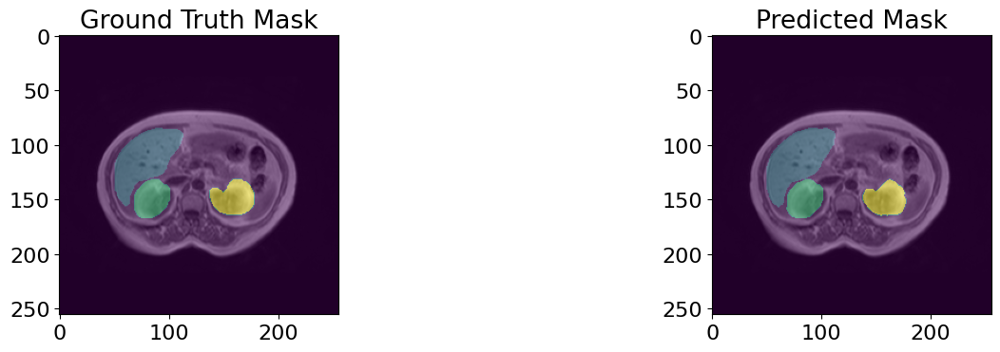

125/125 - 55s - loss: 0.0078 - accuracy: 0.9989 - mean_iou: 0.9741 - val_loss: 0.0444 - val_accuracy: 0.9887 - val_mean_iou: 0.7908 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 70/1000


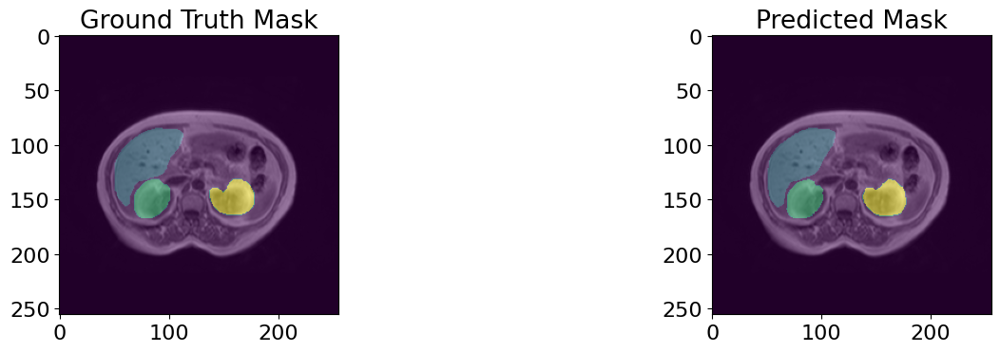

125/125 - 55s - loss: 0.0077 - accuracy: 0.9989 - mean_iou: 0.9740 - val_loss: 0.0466 - val_accuracy: 0.9884 - val_mean_iou: 0.7886 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 71/1000


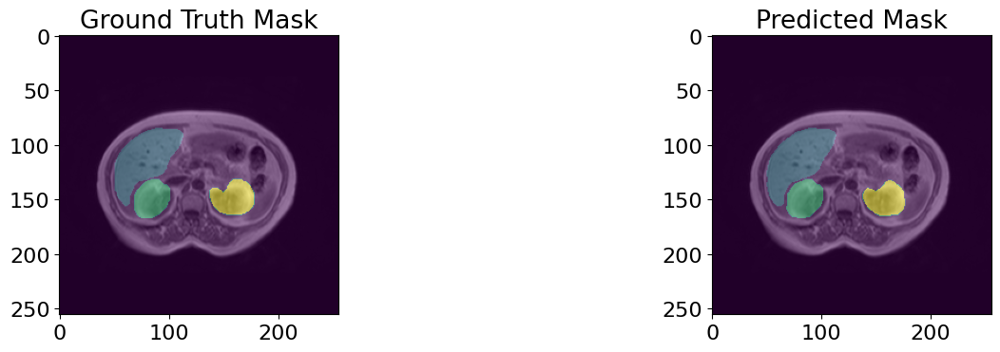

125/125 - 55s - loss: 0.0072 - accuracy: 0.9989 - mean_iou: 0.9757 - val_loss: 0.0492 - val_accuracy: 0.9885 - val_mean_iou: 0.7905 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 72/1000


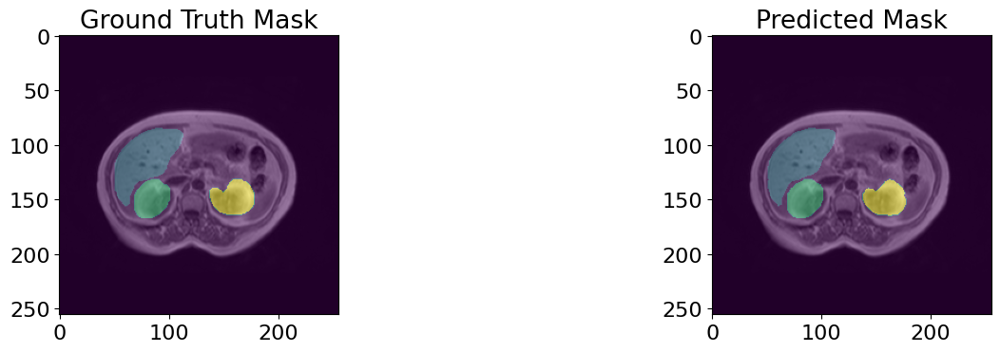

125/125 - 55s - loss: 0.0069 - accuracy: 0.9990 - mean_iou: 0.9768 - val_loss: 0.0499 - val_accuracy: 0.9892 - val_mean_iou: 0.7997 - lr: 0.0010 - 55s/epoch - 442ms/step
Epoch 73/1000


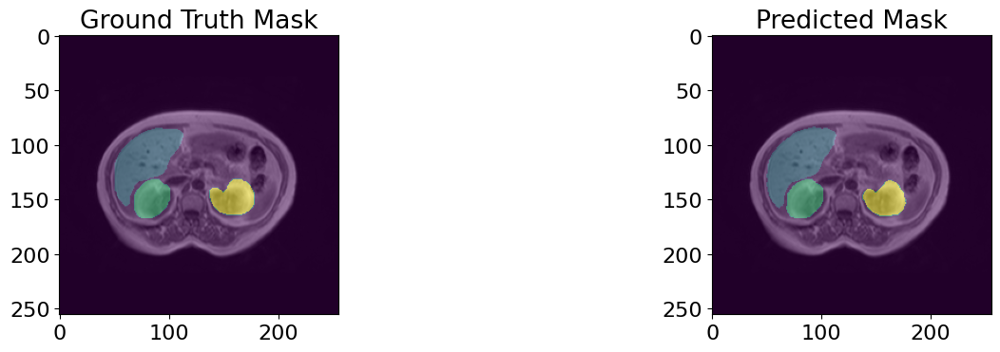

125/125 - 55s - loss: 0.0067 - accuracy: 0.9990 - mean_iou: 0.9770 - val_loss: 0.0507 - val_accuracy: 0.9887 - val_mean_iou: 0.7922 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 74/1000


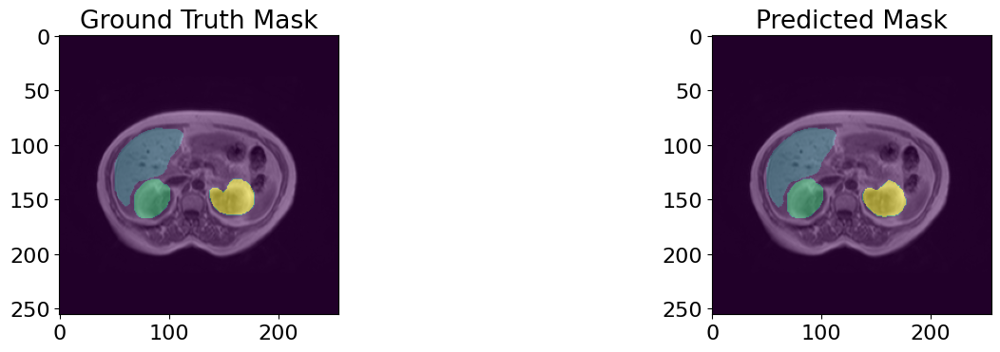

125/125 - 55s - loss: 0.0066 - accuracy: 0.9990 - mean_iou: 0.9783 - val_loss: 0.0496 - val_accuracy: 0.9888 - val_mean_iou: 0.7937 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 75/1000


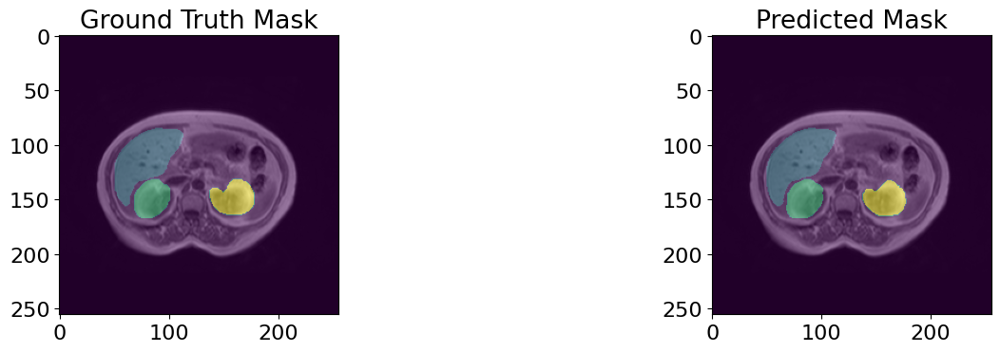

125/125 - 55s - loss: 0.0064 - accuracy: 0.9990 - mean_iou: 0.9783 - val_loss: 0.0504 - val_accuracy: 0.9884 - val_mean_iou: 0.7876 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 76/1000


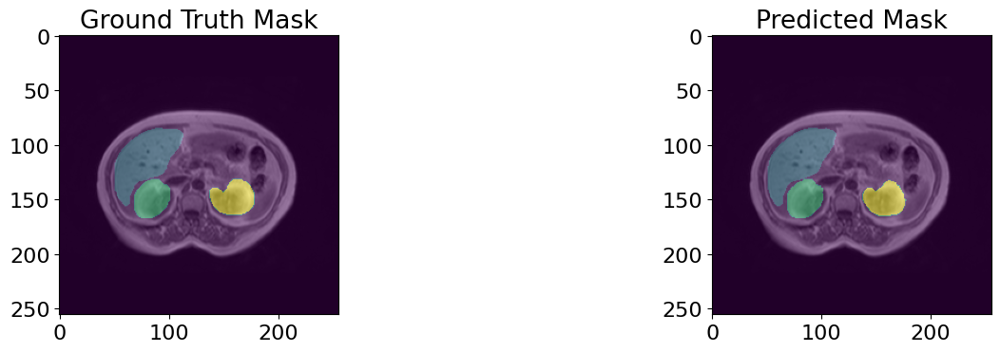

125/125 - 55s - loss: 0.0062 - accuracy: 0.9991 - mean_iou: 0.9786 - val_loss: 0.0503 - val_accuracy: 0.9891 - val_mean_iou: 0.7968 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 77/1000


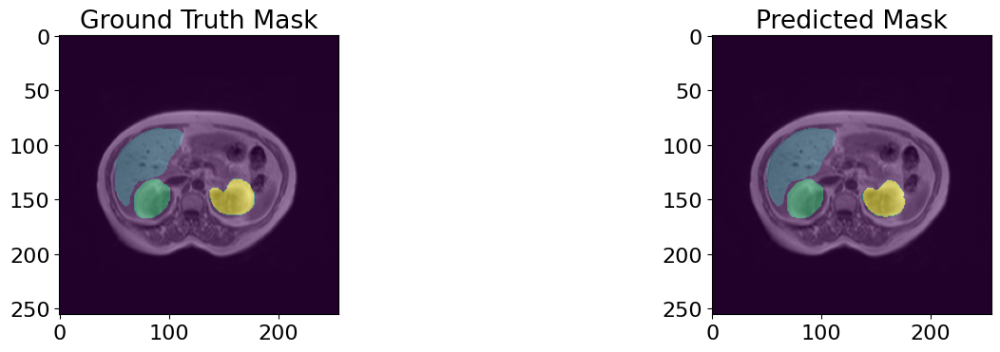

125/125 - 55s - loss: 0.0060 - accuracy: 0.9991 - mean_iou: 0.9795 - val_loss: 0.0513 - val_accuracy: 0.9886 - val_mean_iou: 0.7937 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 78/1000


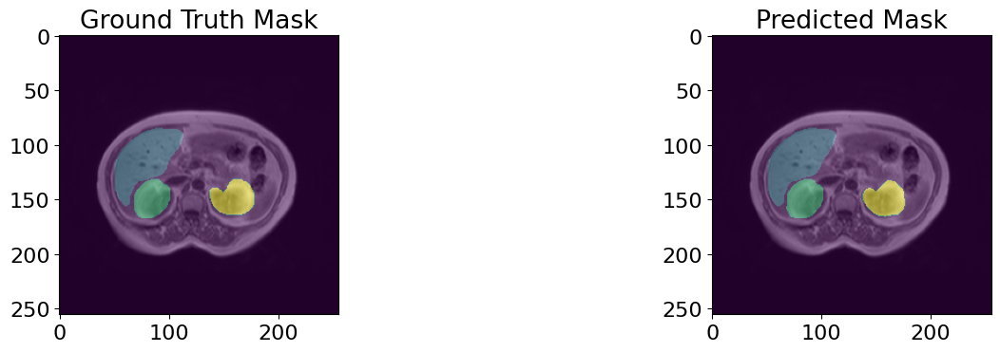

125/125 - 55s - loss: 0.0058 - accuracy: 0.9992 - mean_iou: 0.9807 - val_loss: 0.0502 - val_accuracy: 0.9888 - val_mean_iou: 0.7935 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 79/1000


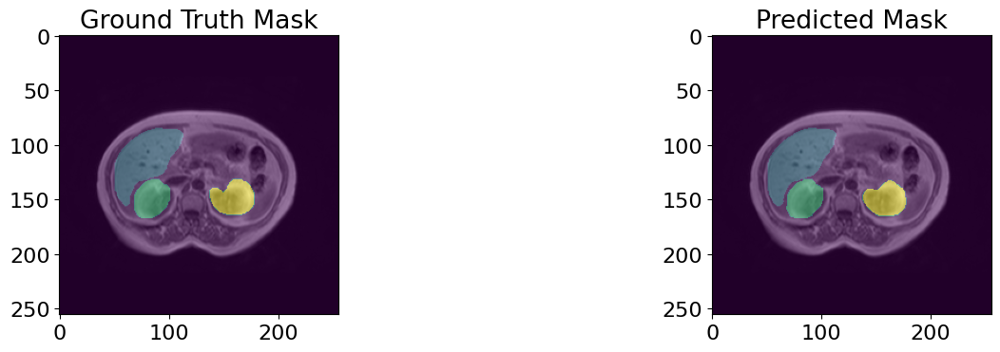

125/125 - 55s - loss: 0.0058 - accuracy: 0.9992 - mean_iou: 0.9807 - val_loss: 0.0500 - val_accuracy: 0.9888 - val_mean_iou: 0.7934 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 80/1000


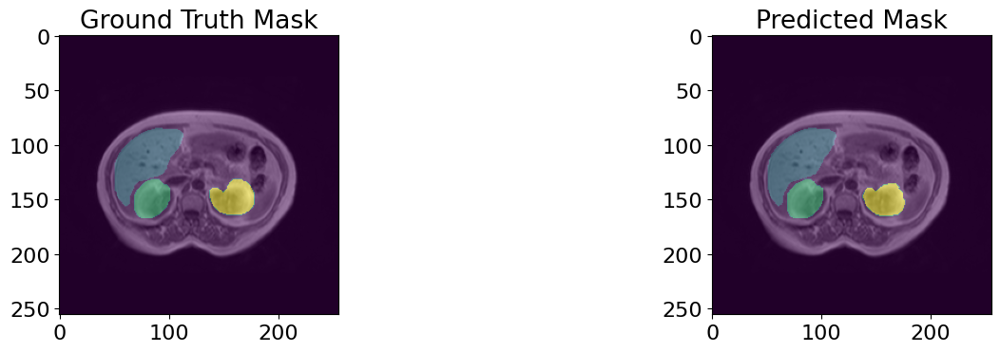

125/125 - 55s - loss: 0.0055 - accuracy: 0.9992 - mean_iou: 0.9805 - val_loss: 0.0522 - val_accuracy: 0.9888 - val_mean_iou: 0.7944 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 81/1000


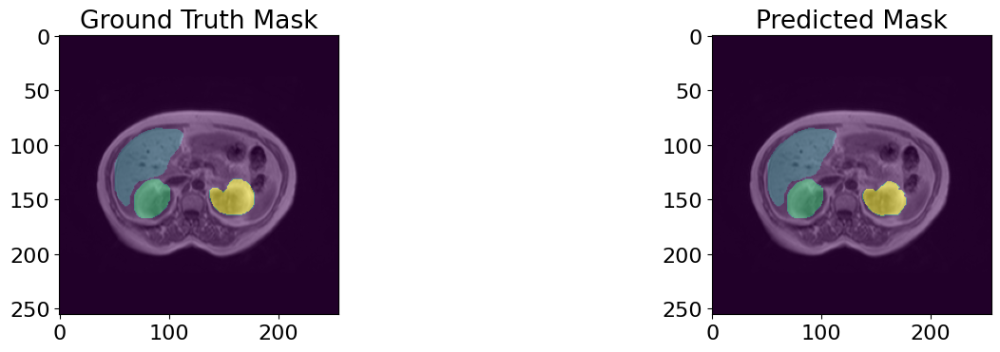

125/125 - 55s - loss: 0.0057 - accuracy: 0.9992 - mean_iou: 0.9804 - val_loss: 0.0507 - val_accuracy: 0.9888 - val_mean_iou: 0.7919 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 82/1000


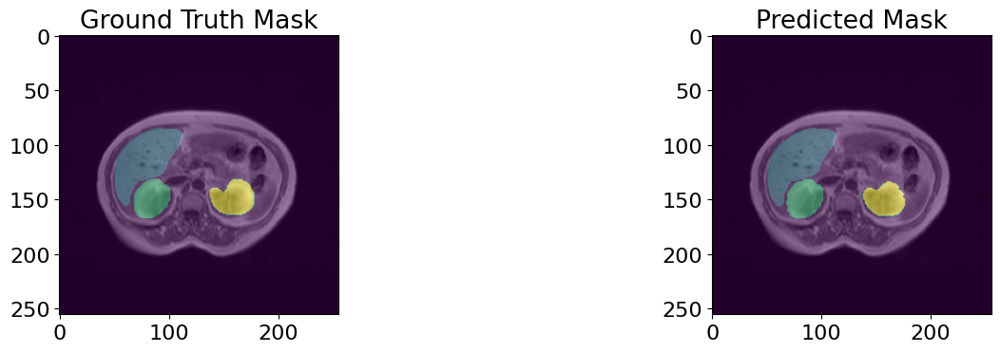

125/125 - 55s - loss: 0.0053 - accuracy: 0.9992 - mean_iou: 0.9820 - val_loss: 0.0524 - val_accuracy: 0.9887 - val_mean_iou: 0.7893 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 83/1000


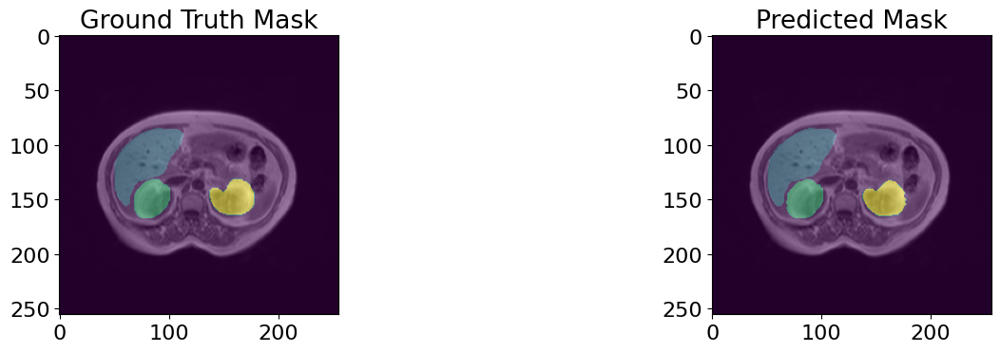

125/125 - 55s - loss: 0.0053 - accuracy: 0.9992 - mean_iou: 0.9819 - val_loss: 0.0501 - val_accuracy: 0.9888 - val_mean_iou: 0.7925 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 84/1000


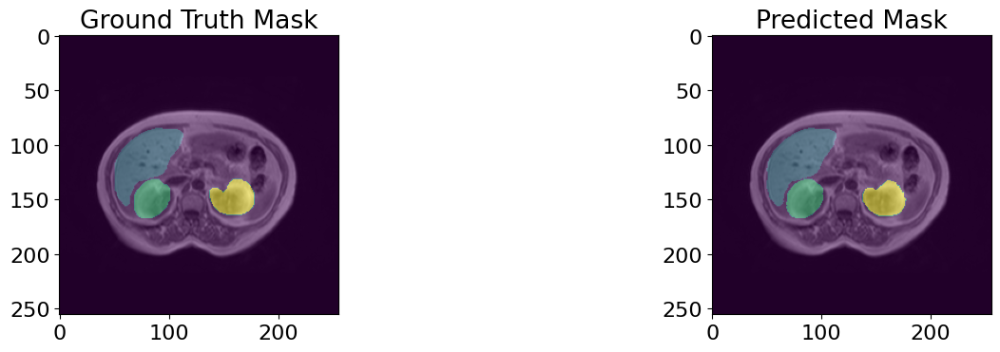

125/125 - 55s - loss: 0.0053 - accuracy: 0.9992 - mean_iou: 0.9807 - val_loss: 0.0524 - val_accuracy: 0.9888 - val_mean_iou: 0.7953 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 85/1000


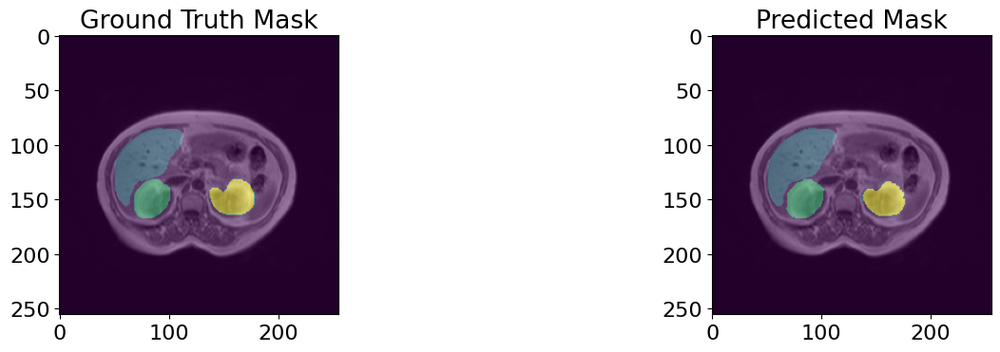

125/125 - 55s - loss: 0.0053 - accuracy: 0.9991 - mean_iou: 0.9790 - val_loss: 0.0510 - val_accuracy: 0.9891 - val_mean_iou: 0.7905 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 86/1000


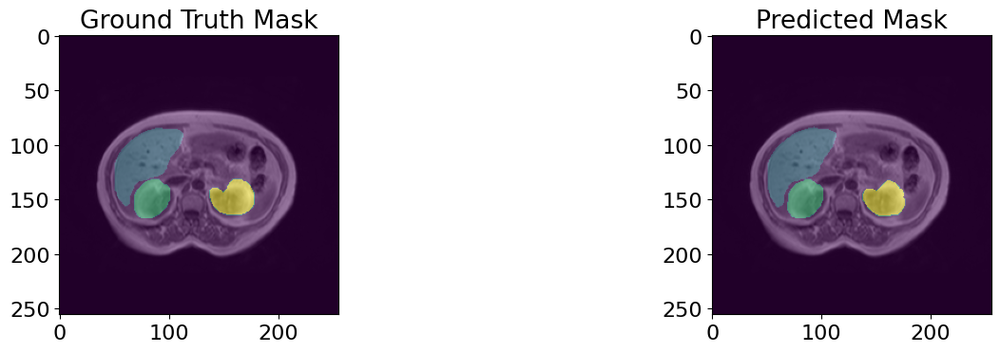

125/125 - 55s - loss: 0.0049 - accuracy: 0.9992 - mean_iou: 0.9818 - val_loss: 0.0500 - val_accuracy: 0.9890 - val_mean_iou: 0.7945 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 87/1000


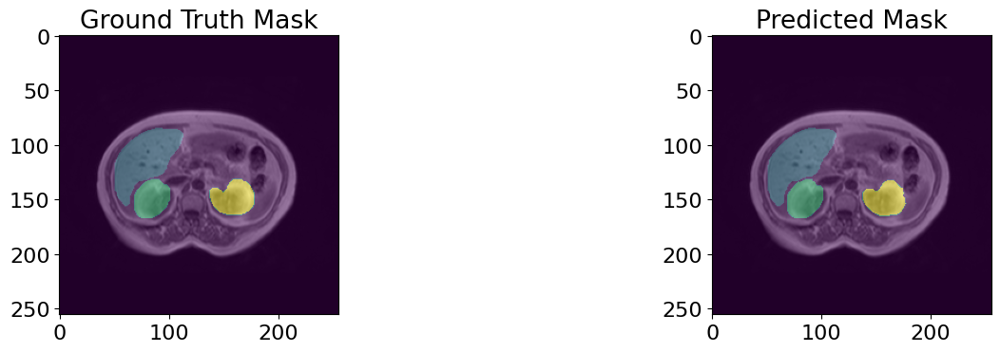

125/125 - 55s - loss: 0.0049 - accuracy: 0.9993 - mean_iou: 0.9824 - val_loss: 0.0521 - val_accuracy: 0.9890 - val_mean_iou: 0.7918 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 88/1000


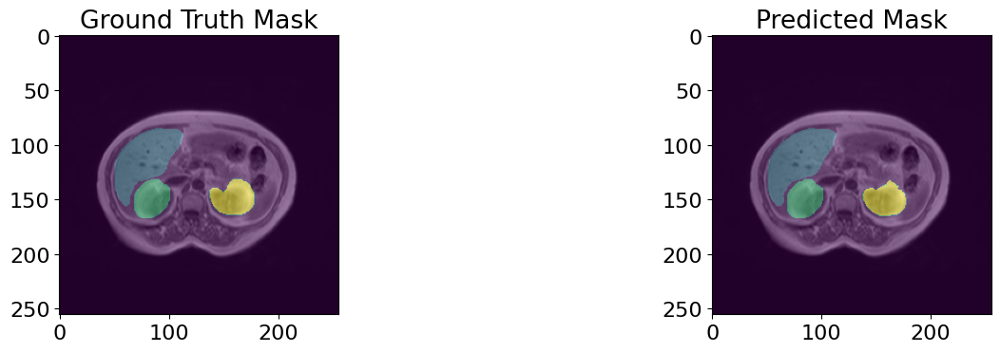

125/125 - 55s - loss: 0.0049 - accuracy: 0.9993 - mean_iou: 0.9832 - val_loss: 0.0497 - val_accuracy: 0.9889 - val_mean_iou: 0.7893 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 89/1000


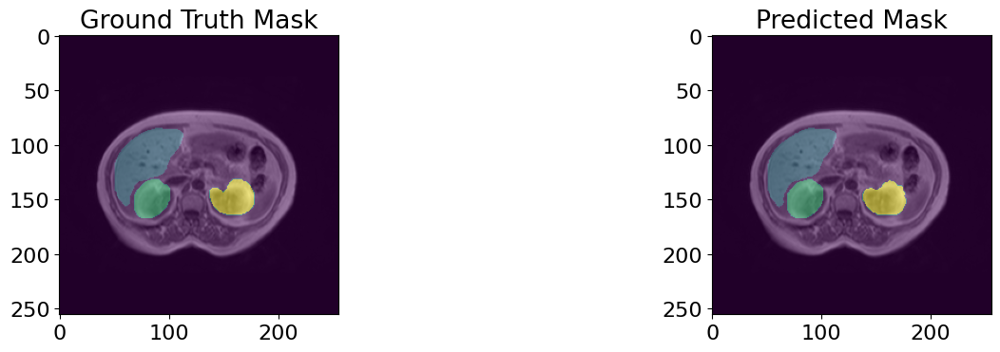

125/125 - 55s - loss: 0.0047 - accuracy: 0.9993 - mean_iou: 0.9836 - val_loss: 0.0534 - val_accuracy: 0.9888 - val_mean_iou: 0.7920 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 90/1000


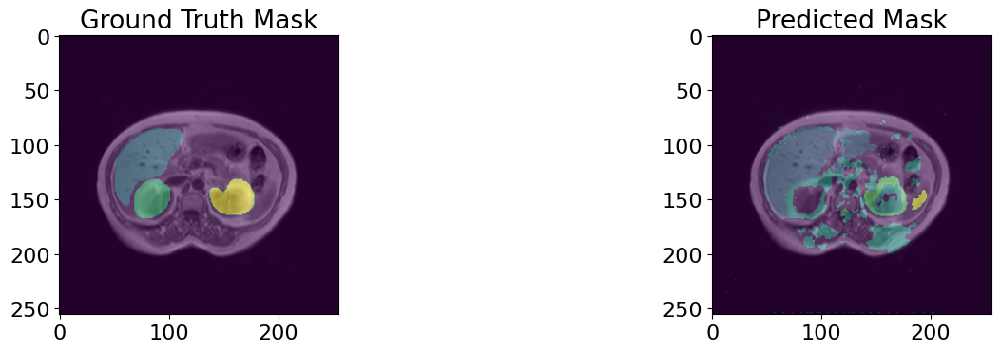

125/125 - 55s - loss: 0.0105 - accuracy: 0.9972 - mean_iou: 0.9305 - val_loss: 0.7524 - val_accuracy: 0.8902 - val_mean_iou: 0.4536 - lr: 0.0010 - 55s/epoch - 440ms/step
Epoch 91/1000


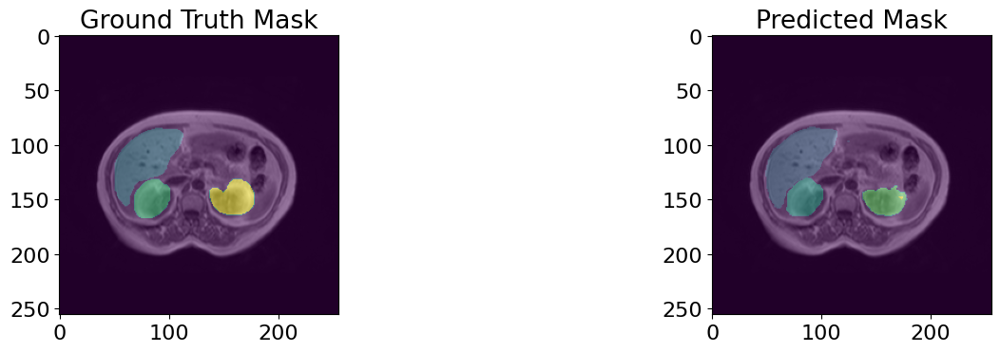

125/125 - 55s - loss: 0.0199 - accuracy: 0.9934 - mean_iou: 0.8563 - val_loss: 0.0585 - val_accuracy: 0.9874 - val_mean_iou: 0.7637 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 92/1000


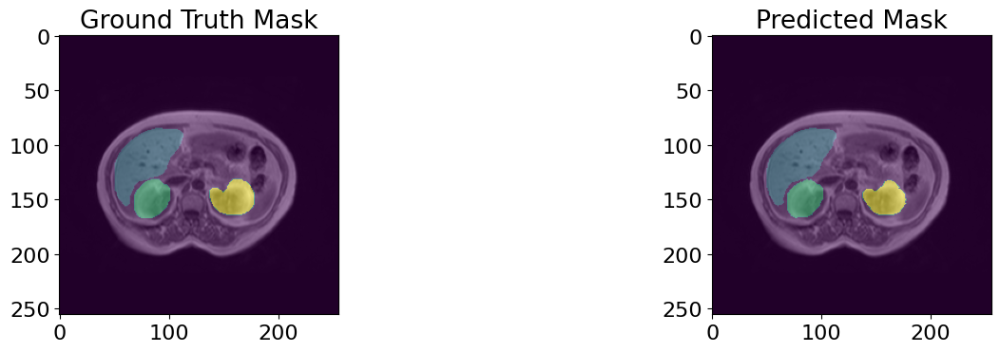

125/125 - 55s - loss: 0.0090 - accuracy: 0.9975 - mean_iou: 0.9401 - val_loss: 0.0375 - val_accuracy: 0.9890 - val_mean_iou: 0.7893 - lr: 0.0010 - 55s/epoch - 441ms/step
Epoch 93/1000


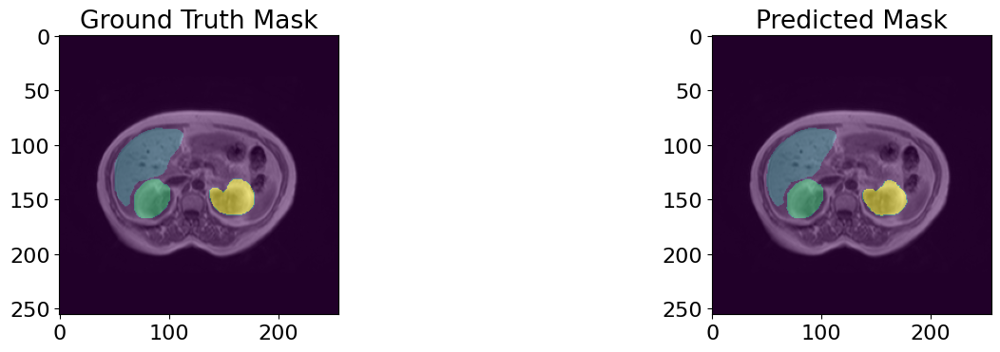

125/125 - 55s - loss: 0.0059 - accuracy: 0.9987 - mean_iou: 0.9684 - val_loss: 0.0401 - val_accuracy: 0.9892 - val_mean_iou: 0.7963 - lr: 1.0000e-04 - 55s/epoch - 440ms/step
Epoch 94/1000


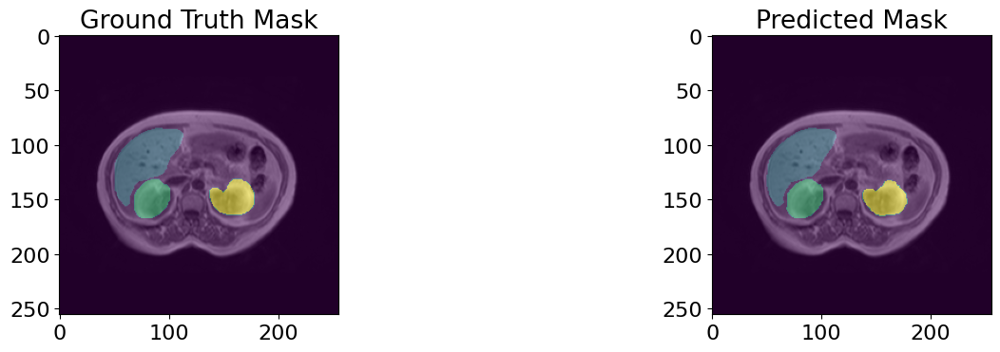

125/125 - 55s - loss: 0.0055 - accuracy: 0.9989 - mean_iou: 0.9733 - val_loss: 0.0418 - val_accuracy: 0.9892 - val_mean_iou: 0.7966 - lr: 1.0000e-04 - 55s/epoch - 440ms/step
Epoch 95/1000


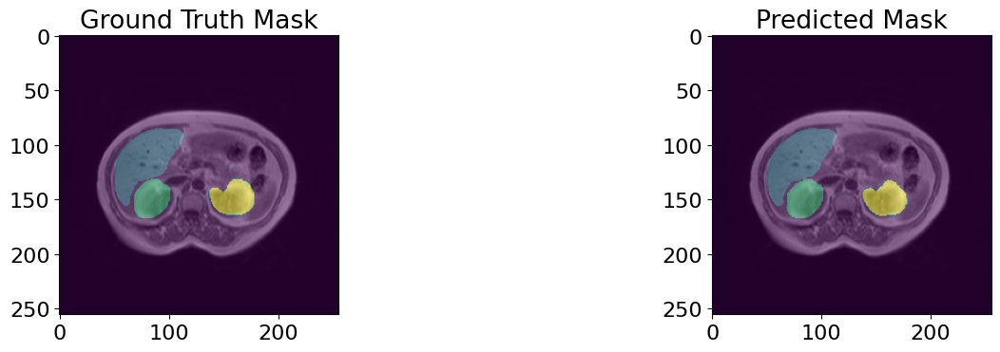

125/125 - 55s - loss: 0.0054 - accuracy: 0.9990 - mean_iou: 0.9756 - val_loss: 0.0424 - val_accuracy: 0.9892 - val_mean_iou: 0.7984 - lr: 1.0000e-04 - 55s/epoch - 443ms/step
Epoch 96/1000


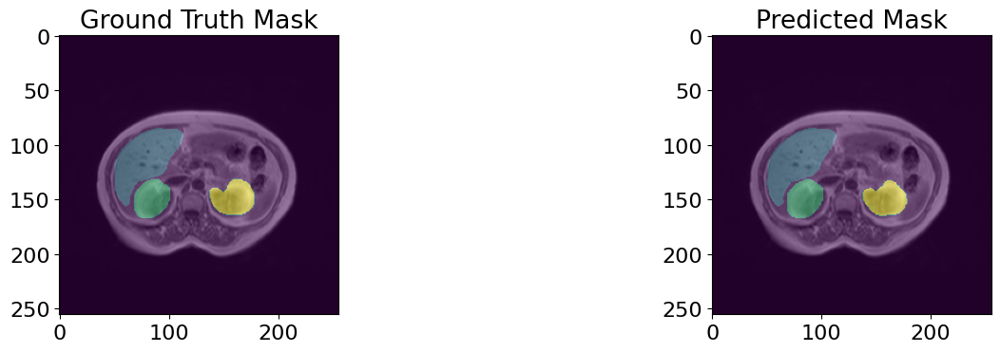

125/125 - 55s - loss: 0.0051 - accuracy: 0.9991 - mean_iou: 0.9779 - val_loss: 0.0433 - val_accuracy: 0.9892 - val_mean_iou: 0.7984 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 97/1000


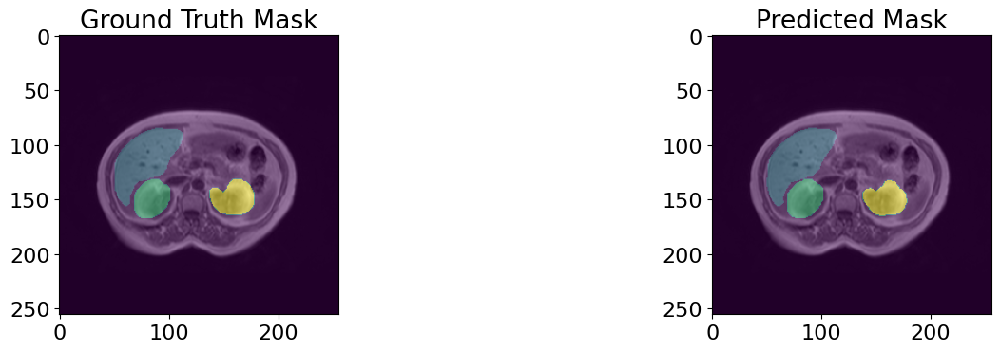

125/125 - 55s - loss: 0.0049 - accuracy: 0.9991 - mean_iou: 0.9784 - val_loss: 0.0440 - val_accuracy: 0.9891 - val_mean_iou: 0.7994 - lr: 1.0000e-04 - 55s/epoch - 440ms/step
Epoch 98/1000


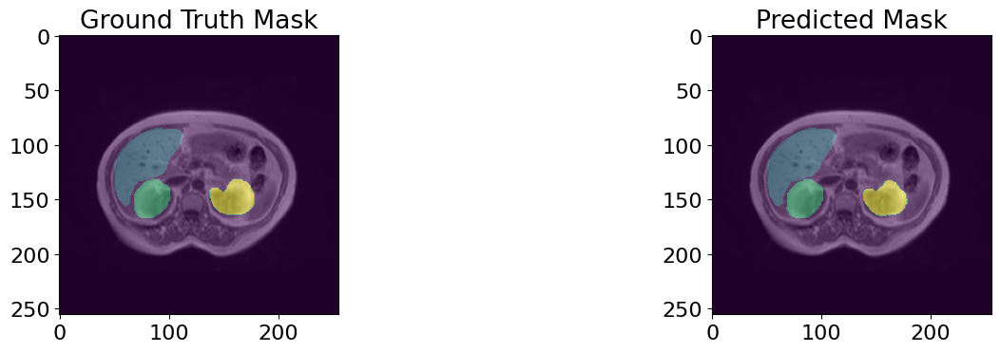

125/125 - 55s - loss: 0.0047 - accuracy: 0.9992 - mean_iou: 0.9812 - val_loss: 0.0447 - val_accuracy: 0.9891 - val_mean_iou: 0.7980 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 99/1000


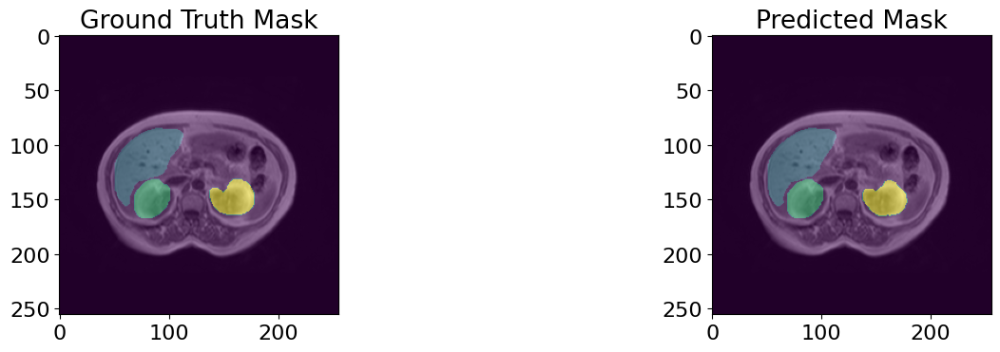

125/125 - 55s - loss: 0.0046 - accuracy: 0.9992 - mean_iou: 0.9815 - val_loss: 0.0452 - val_accuracy: 0.9890 - val_mean_iou: 0.7970 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 100/1000


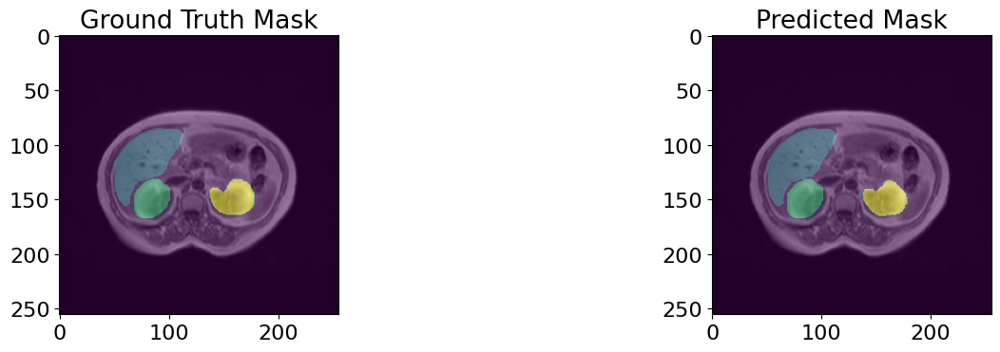

125/125 - 55s - loss: 0.0046 - accuracy: 0.9993 - mean_iou: 0.9830 - val_loss: 0.0451 - val_accuracy: 0.9891 - val_mean_iou: 0.7985 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 101/1000


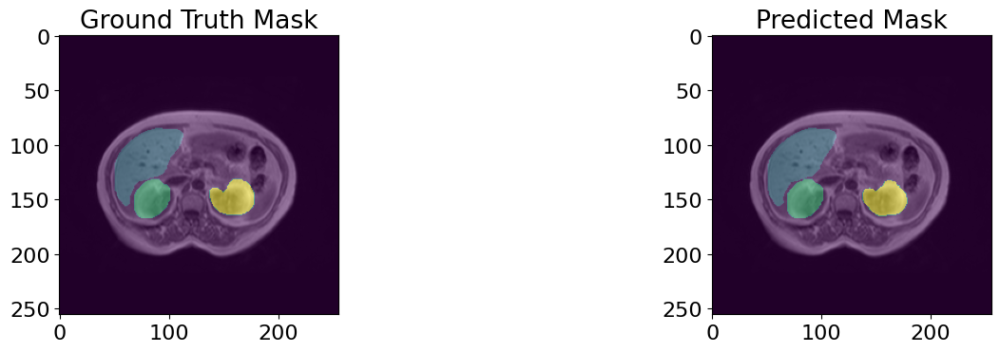

125/125 - 55s - loss: 0.0044 - accuracy: 0.9993 - mean_iou: 0.9838 - val_loss: 0.0459 - val_accuracy: 0.9891 - val_mean_iou: 0.7978 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 102/1000


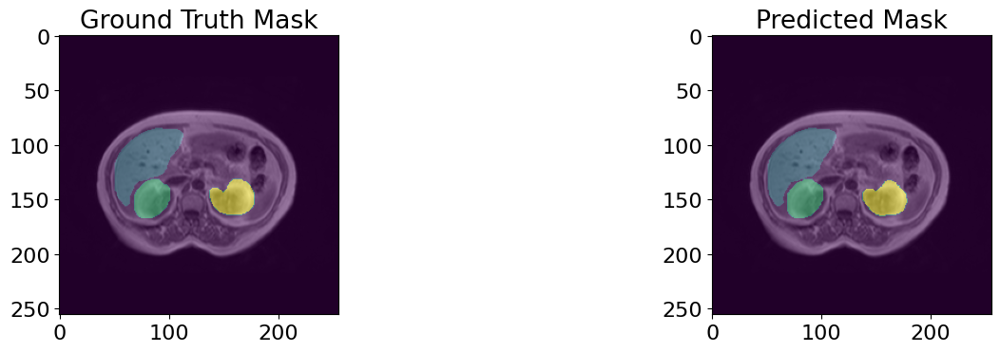

125/125 - 55s - loss: 0.0044 - accuracy: 0.9993 - mean_iou: 0.9846 - val_loss: 0.0465 - val_accuracy: 0.9891 - val_mean_iou: 0.7980 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 103/1000


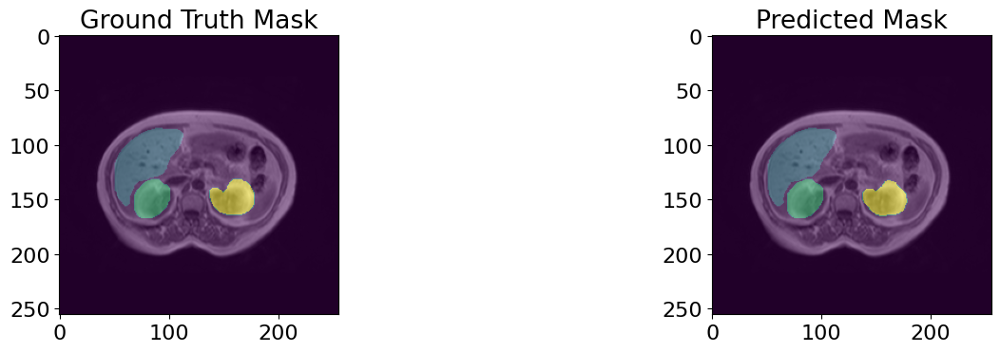

125/125 - 55s - loss: 0.0041 - accuracy: 0.9994 - mean_iou: 0.9859 - val_loss: 0.0471 - val_accuracy: 0.9890 - val_mean_iou: 0.7975 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 104/1000


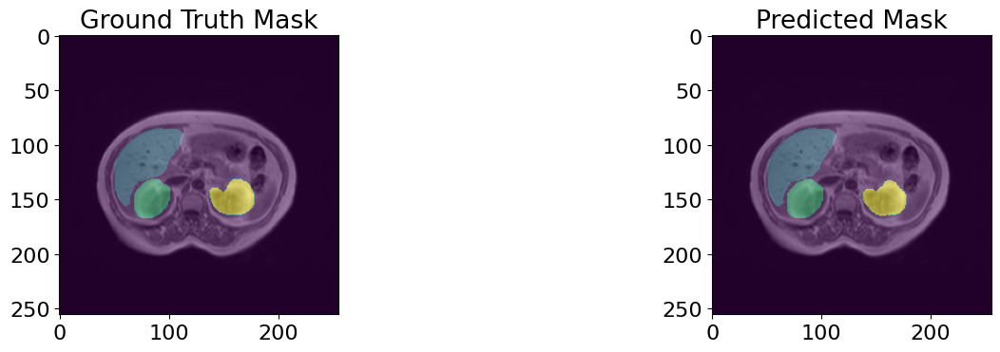

125/125 - 55s - loss: 0.0042 - accuracy: 0.9994 - mean_iou: 0.9865 - val_loss: 0.0473 - val_accuracy: 0.9890 - val_mean_iou: 0.7974 - lr: 1.0000e-04 - 55s/epoch - 440ms/step
Epoch 105/1000


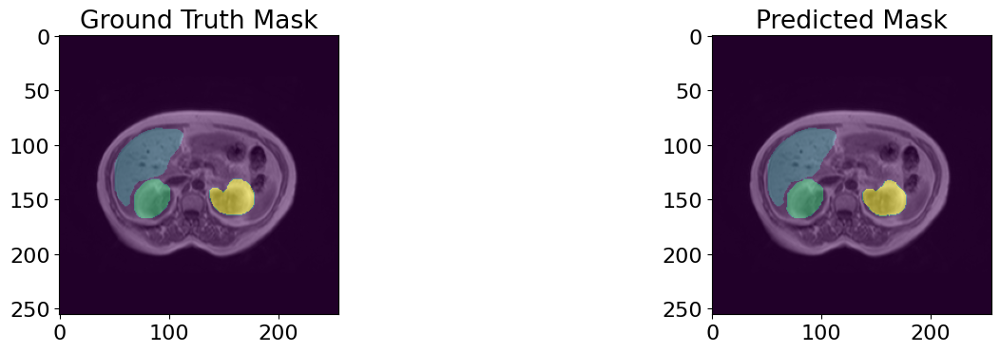

125/125 - 55s - loss: 0.0041 - accuracy: 0.9995 - mean_iou: 0.9873 - val_loss: 0.0476 - val_accuracy: 0.9890 - val_mean_iou: 0.7967 - lr: 1.0000e-04 - 55s/epoch - 442ms/step
Epoch 106/1000


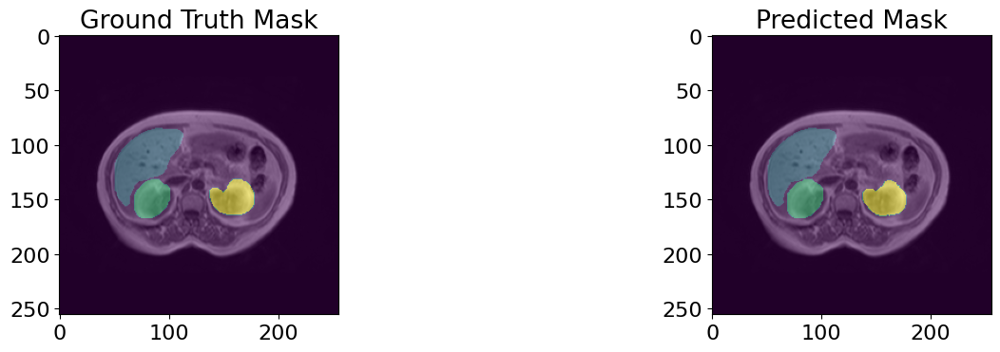

125/125 - 55s - loss: 0.0039 - accuracy: 0.9995 - mean_iou: 0.9881 - val_loss: 0.0484 - val_accuracy: 0.9890 - val_mean_iou: 0.7967 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 107/1000


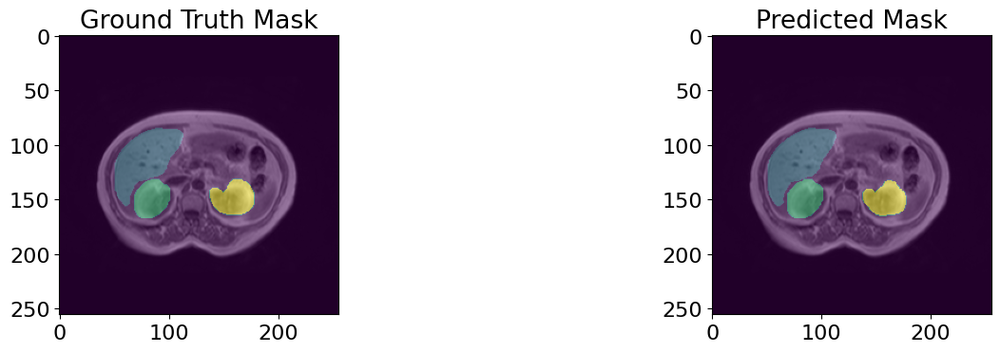

125/125 - 55s - loss: 0.0040 - accuracy: 0.9995 - mean_iou: 0.9880 - val_loss: 0.0488 - val_accuracy: 0.9890 - val_mean_iou: 0.7961 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 108/1000


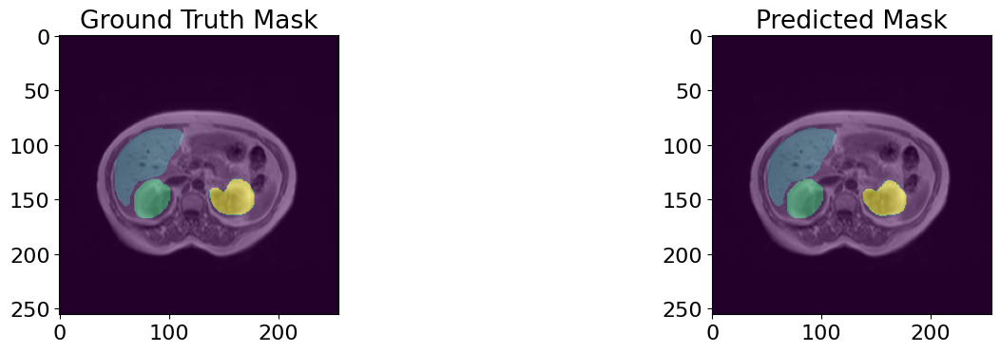

125/125 - 55s - loss: 0.0040 - accuracy: 0.9995 - mean_iou: 0.9889 - val_loss: 0.0490 - val_accuracy: 0.9889 - val_mean_iou: 0.7962 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 109/1000


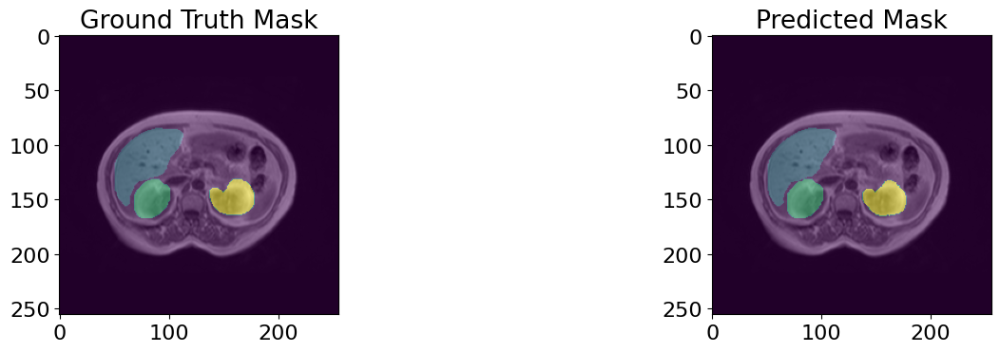

125/125 - 55s - loss: 0.0038 - accuracy: 0.9995 - mean_iou: 0.9896 - val_loss: 0.0498 - val_accuracy: 0.9889 - val_mean_iou: 0.7951 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 110/1000


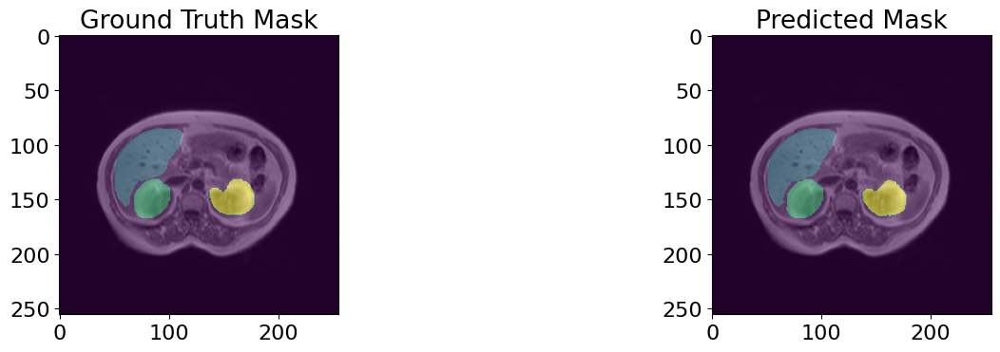

125/125 - 55s - loss: 0.0039 - accuracy: 0.9996 - mean_iou: 0.9901 - val_loss: 0.0497 - val_accuracy: 0.9889 - val_mean_iou: 0.7951 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 111/1000


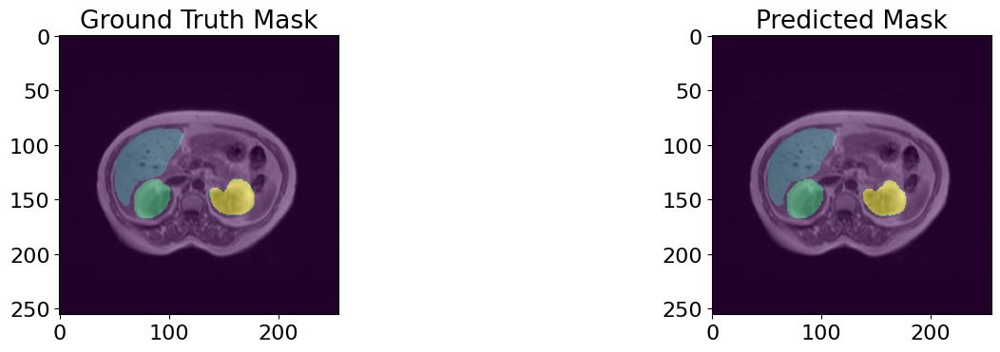

125/125 - 55s - loss: 0.0039 - accuracy: 0.9996 - mean_iou: 0.9902 - val_loss: 0.0501 - val_accuracy: 0.9889 - val_mean_iou: 0.7943 - lr: 1.0000e-04 - 55s/epoch - 441ms/step
Epoch 112/1000


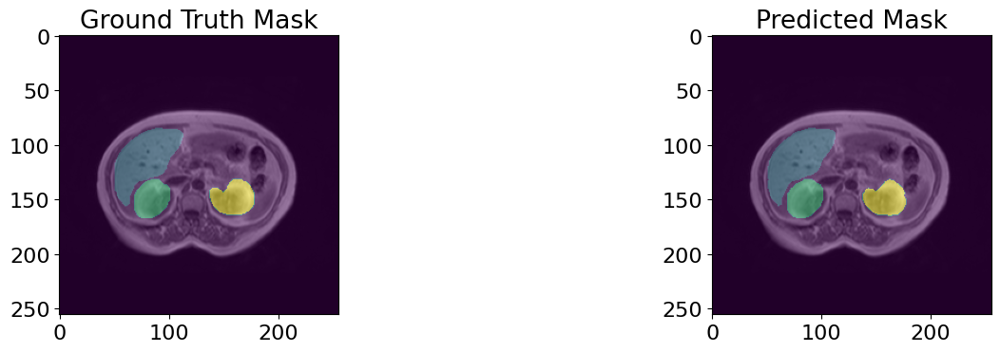

125/125 - 55s - loss: 0.0036 - accuracy: 0.9996 - mean_iou: 0.9911 - val_loss: 0.0509 - val_accuracy: 0.9889 - val_mean_iou: 0.7947 - lr: 1.0000e-04 - 55s/epoch - 443ms/step


In [18]:
history = model.fit(
    x=X_train,
    y=y_train,
    epochs = epochs,
    batch_size = batch_size,
    validation_data = (X_val, y_val),
    callbacks=[early_stopping, viz_callback, scheduler],
    verbose=2
    )

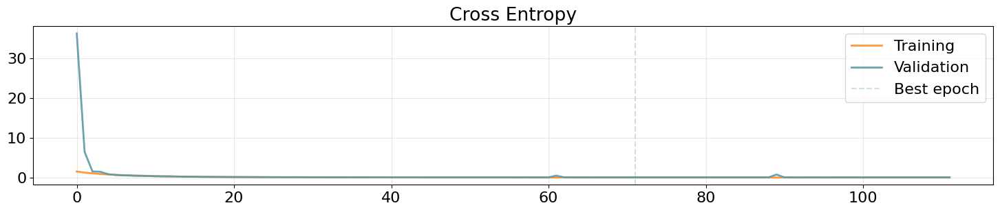

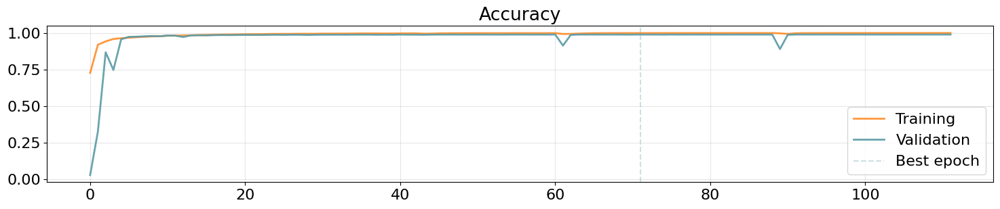

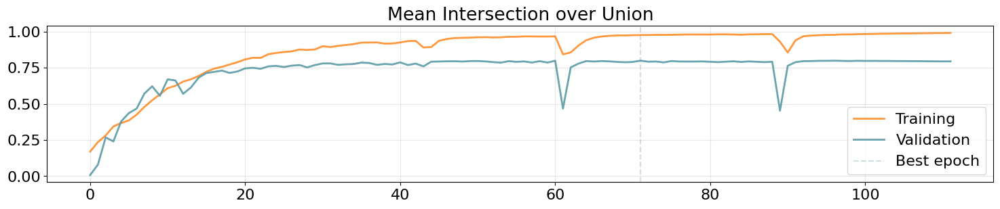

In [19]:
best_epoch = np.argmax(history.history['val_mean_iou'])
plt.figure(figsize=(18,3))
plt.plot(history.history['loss'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_loss'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Cross Entropy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(18,3))
plt.plot(history.history['accuracy'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_accuracy'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Accuracy')
plt.legend()
plt.grid(alpha=.3)
plt.show()

plt.figure(figsize=(18,3))
plt.plot(history.history['mean_iou'], label='Training', alpha=.8, color='#ff7f0e', linewidth=2)
plt.plot(history.history['val_mean_iou'], label='Validation', alpha=.9, color='#5a9aa5', linewidth=2)
plt.axvline(x=best_epoch, label='Best epoch', alpha=.3, ls='--', color='#5a9aa5')
plt.title('Mean Intersection over Union')
plt.legend()
plt.grid(alpha=.3)
plt.show()

In [20]:
model.save('MultiResUnet_augmented.h5')

In [21]:
# Evaluate the model on the test set and print the results
test_loss, test_accuracy, test_mean_iou = model.evaluate(X_test, y_test, verbose=0, batch_size=10)
print(f'Test Accuracy: {round(test_accuracy, 4)}')
print(f'Test Mean Intersection over Union: {round(test_mean_iou, 4)}')

Test Accuracy: 0.9886
Test Mean Intersection over Union: 0.7703


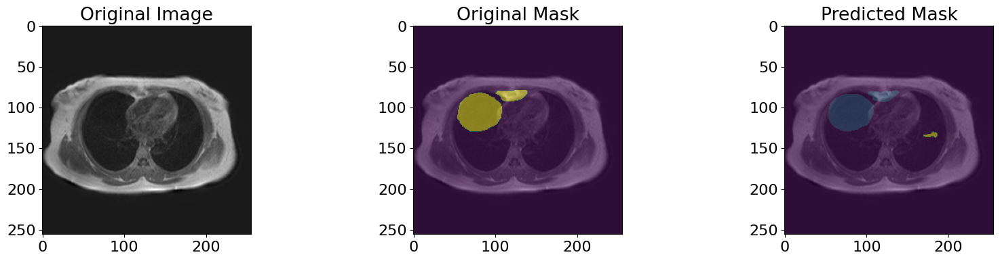

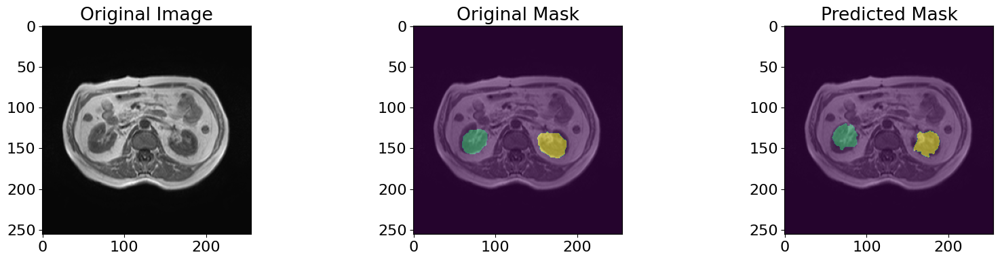

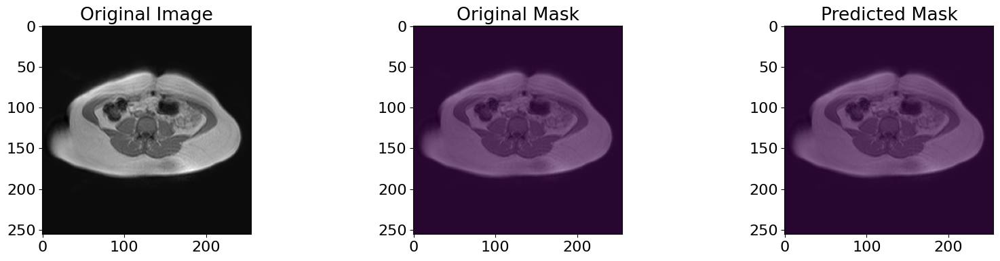

In [22]:
# Define a function to plot triptychs for model predictions
def plot_triptychs(data, labels, index=None):
    # If index is not specified, randomly select one
    if index is None:
        index = np.random.randint(0, len(data))

    # Generate predictions for the selected index
    pred = model.predict(np.expand_dims(data[index], axis=0), verbose=0)
    pred = np.array(tf.math.argmax(pred, axis=-1))
    pred = np.reshape(pred, (256, 256, 1))

    # Plot the original image, original mask, and predicted mask
    fig, axes = plt.subplots(1, 3, figsize=(20, 4))
    axes[0].set_title("Original Image")
    axes[0].imshow(data[index], cmap='gray')
    axes[1].set_title("Original Mask")
    axes[1].imshow(data[index], cmap='gray')
    #colored_image = display_color_mapped_image_continuous(labels[index])
    axes[1].imshow(np.squeeze(labels[index]),alpha=0.5)
    axes[2].set_title("Predicted Mask")
    axes[2].imshow(data[index], cmap='gray')
    #colored_image = display_color_mapped_image_continuous(pred)
    axes[2].imshow(np.squeeze(pred), alpha=0.5)
    plt.show()

# Plot triptychs for three random samples from the test set
plot_triptychs(X_test, y_test)
plot_triptychs(X_test, y_test)
plot_triptychs(X_test, y_test)